# TALLER 4

- Johana Nataly Tinoco Gómez
- Juan Manuel Vargas Garcia 

### 1. Investigar y definir el ruido Speckle.

El ruido Speakle, es un ruido granular que aparece en imágenes con iluminación coherente, como las de scanner ultrasónico, sonar y radar de abertura sintética (SAR). Dicho ruido no es como el modelo de ruido clasico, en el que suponen un ruido Gaussiano (independiente de la señal y adicionado al verdadero valor), el Speakle por su lado es multiplicatiivo y no Gaussiano (en los formatos intensidad y amplitud), ademas, dificulta la interpretación de las imágenes porque el “efecto de sal y pimienta” corrompe la información o verdad del terreno. Para extraer este ruido existen numerosas técnicas, entre las cuales las estadísticas proveen los mejores modelos y herramientas para el procesamiento y análisis de imágenes ruidosa [1].

[1] O. H. Bustos – M. G. Palacio - A. C. Frery (),Asociación española de teledetención, "Filtros interactivos reductores de ruido speckle en imágenes"  disponible en http://www.aet.org.es/?q=revista17-7

### 2. Filtros espaciales (media, maximo, minimo, mediana, mediana ponderada, gaussiano)

Para este punto lo primero que se hizo fue realizar diferentes funciones con los diferentes filtros (media, maximo, minimo, mediana, mediana ponderada, gaussiano) cada uno con tres tipos de ventanas 3x3, 5x5 y 11x11. Los filtros espaciales se definen en un entorno de vecindad del punto a transformar (x,y); dichos filtros se clasifican en dos tipos de filtros, los lineales (filtro de media, gaussiano ) y los no lineales (mediana, máximo,mínimo).


* **Filtros no lineales**

Para estos filtros lo primero que se hizo fue agregar una columna a la izquiera y a la derecha de la matriz, asi como un vector de ceros, en la parte superior e inferior de la matriz. Depues de tener la matriz con los ceros, se procede  a recorrer la matriz, en ventanas traslapadas de 3x3, 5x5 y 11X11.

Con cada una de estas submatrices de 3X3, 5x5 o 11x11, segun corresponda la ventana del filro, se convierte a un vector y a este se le calcula dependiendo del tipo de filrto la mediana, el maximo, el minimo; el resultado de esto se ubica en la posición $x,y$ (centro de la submatriz), al terminar el recorrido de la matriz, se tendra como resultado una matriz del mismo tamaño de la matriz de entrada, el procedimiento anterior se puede observar en la *figura 2*.

<img src="filtromediana.jpg"> 
*Figura 2.Filtro de mediana*


* **Filtros lineales**

Para poder realizar esto se debe tener en cuenta que en el espacio del tiempo se debe realizar una convolución entre los diferentes nucleos y la imagen, para poder realizar la convolución se debe recorrer la imagen en ventanas de 3X3, 5x5 o 11x11 multiplicando punto a punto cada uno de las valores de la ventana, y se hace una suma con cada uno de los valores de estas submatrices y este valor se poner en el centro de dicha submatriz, al terminar se tendra como resultado una matriz del mismo tamaño de la original. 

* Metodos de evaluación de desempeño*

Como se explico anteriormente este tipo de ruido no es gaussiano, por ende el filtro gaussiano no es el indicado para tratarlo, como se demuestra en los indicadores de desempeño, por ejemplo en SNR fueron los filtros que menor desempeño obtuvieron; por otro lado, filtros como mediana pondera, mediana y media dieron los mejores resultado, y los filtros minimo y maximo estan en un punto medio.

$ Graficas desempeño *SNR*$
<img src="SNR.jpg">
<img src="graficoSNR.jpg">

$ Graficas desempeño *EPI*$
<img src="EPI.jpg">
<img src="graficaepi.jpg">


$ Graficas desempeño *COC*$
<img src="graficacoc.jpg">

Función para convertir espacio de color a Lab

In [1]:
def convertirespaciodecolor(D):
    import cv2
    import matplotlib.pyplot as plt
    import matplotlib.image as myimg
    import numpy as np
    D=cv2.cvtColor(D,cv2.COLOR_RGB2BGR)
    D=cv2.cvtColor(D,cv2.COLOR_BGR2Lab)
    return D

Función para agregar ceros a la matriz 

In [2]:
def agregarceros(imD):
    tama=imD.shape
    tama=list(tama)
    #print(tama)
    nueva=np.zeros((tama[0]+2,tama[1]+2))
    #print(nuevaA)
    tamanu=nueva.shape
    tamanu=list(tamanu)

    for x in range (tama[0]) :
        for y in range(tama[1]):
            nueva[x+1,y+1]=imD[x,y]
            
    return nueva,tama,tamanu

## Funciones  medotos de evaluación de desempeño

#### SNR

In [3]:
#Calculo de SNR
def SNR(imf,ima,im):
    dime=imf.shape
    dime=list(dime)
    n=dime[0]*dime[1]*dime[2]
    MSE=0
    RES=0
   
    for z in range(dime[2]):
        for x in range(dime[0]):
            for y in range(dime[1]):
                RES=((imf[x,y,z])-(ima[x,y,z]))*((imf[x,y,z])-(ima[x,y,z]))
                MSE=RES+MSE

    #MSEn=np.abs(np.var(ima-imf))
    MSEn=MSE/n
    var=np.var(im)
    div=var/MSEn
    loga=math.log10(div)
    SNR=round(10*loga,2)
    return SNR

#### EPI

In [4]:
#calcular EPI
def EPI(imf,im1):
    kla=np.array([(0,-1,0),(-1,4,-1),(0,-1,0)])
    kal=np.array([(-1,-1,-1),(-1,9,-1),(-1,-1,-1)])
    F=cv2.filter2D(im1,-1,kla)
    I=cv2.filter2D(imf,-1,kla)
    DF=cv2.filter2D(F,-1,kal)
    DI=cv2.filter2D(I,-1,kal)
    MDF=np.mean(DF)
    MDI=np.mean(DI)
    st=DI.shape
    st=list(st)
    sd=0
    sni=0
    snf=0
    DF=DF/np.max(np.max(DF))
    DI=DI/np.max(np.max(DI))
    for z in range(st[2]):
        for x in range(st[0]):
            for y in range(st[1]):
                de=(DI[x,y,z]-MDI)*((DF[x,y,z]-MDF))
                sd=sd+de
                ni=(DI[x,y,z]-MDI)**2
                sni=sni+ni
                nf=(DF[x,y,z]-MDF)**2
                snf=snf+nf
    mn=sni*snf
    rn=math.sqrt(mn)
    EPI=sd/rn
    return EPI

#### CoC

In [5]:
#calcuar CoC
def COC(imf,im1):
    kla=np.array([(0,-1,0),(0,4,0),(0,-1,0)])
    kal=np.array([(-1,-1,-1),(-1,9,-1),(-1,-1,-1)])
    F=cv2.filter2D(im1,-1,kla)
    I=cv2.filter2D(imf,-1,kla)

    MF=np.mean(F)
    MI=np.mean(I)
    s1=I.shape
    s1=list(s1)
    sd1=0
    sni1=0
    snf1=0
    F=F/np.max(np.max(F))
    I=I/np.max(np.max(I))
    for z in range(s1[2]):
        for x in range(s1[0]):
            for y in range(s1[1]):
                de1=(I[x,y,z]-MI)*((F[x,y,z]-MF))
                sd1=sd1+de1
                ni1=(I[x,y,z]-MI)**2
                sni1=sni1+ni1
                nf1=(F[x,y,z]-MF)**2
                snf1=snf1+nf1
    mn1=sni1*snf1
    rn1=math.sqrt(mn1)
    CoC=sd1/rn1
    return(CoC)

#### QI

In [6]:
#calcular QI
def QI(imf,im1):
    kla=np.array([(0,-1,0),(0,4,0),(0,-1,0)])
    kal=np.array([(-1,-1,-1),(-1,9,-1),(-1,-1,-1)])
    F=cv2.filter2D(im1,-1,kla)
    I=cv2.filter2D(imf,-1,kla) 
    s2=I.shape
    s2=list(s2)
    MF=np.mean(F)
    MI=np.mean(I)
    sd2=0
    for z in range(s2[2]):
        for x in range(s2[0]):
            for y in range(s2[1]):
                de2=(I[x,y,z]-MI)*((F[x,y,z]-MF))
                sd2=sd2+de2
    n=s2[0]*s2[1]*s2[2]
    r=sd2/n-1
    soi=0
    sof=0
    for z in range(s2[2]):
        for x in range(s2[0]):
            for y in range(s2[1]):
                oi=(I[x,y,z]-MI)**2
                of=((F[x,y,z]-MF))**2
                soi=soi+oi
                sof=sof+of
                
    n=s2[0]*s2[1]*s2[2]
    r=sd2/n-1
    doi=soi/n-1
    dof=sof/n-1
    roi=math.sqrt(doi)
    rof=math.sqrt(dof)
    mo=roi*rof
    rd=r/mo

    rd2=(2*MI*MF)/(((MI)**2 )+((MF)**2))
    rd3=(2*mo)/(((rof)**2 )+((roi)**2))
    rdt=rd*rd2*rd3
    return rdt

#### SSI

In [7]:
# calculate SSI
def SSI(imf,im): 
    
    kla=np.array([(0,-1,0),(0,4,0),(0,-1,0)])
    kal=np.array([(-1,-1,-1),(-1,9,-1),(-1,-1,-1)])
    F=cv2.filter2D(im,-1,kla)
    I=cv2.filter2D(imf,-1,kla)
    s2=I.shape
    s2=list(s2)
    MF=np.mean(F)
    MI=np.mean(I)
    sd2=0
    for z in range(s2[2]):
        for x in range(s2[0]):
            for y in range(s2[1]):
                de2=(I[x,y,z]-MI)*((F[x,y,z]-MF))
                sd2=sd2+de2
    n=s2[0]*s2[1]*s2[2]
    r=sd2/n-1
    soi=0
    sof=0
    for z in range(s2[2]):
        for x in range(s2[0]):
            for y in range(s2[1]):
                oi=(I[x,y,z]-MI)**2
                of=((F[x,y,z]-MF))**2
                soi=soi+oi
                sof=sof+of
                
    n=s2[0]*s2[1]*s2[2]
    r=sd2/n-1
    doi=soi/n-1
    dof=sof/n-1
    roi=math.sqrt(doi)
    rof=math.sqrt(dof)
    deno=((2*MI*MF)+2.55)*((2*r)+7.65)
    nume=(((MI)**2)+((MF)**2)+2.55)*(((roi)**2)+((rof)**2)+7.65)
    ssi=(deno/nume)
    return ssi

## Funciones filtros de media

#### Función filtro de 3x3

In [8]:
def filtromedia3x3(nuevaA,tama,tamanu,A):
    import statistics as stats
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (1,tamanu[0]-1) :
        for y in range(1,tamanu[1]-1):
            listd=[nuevaA[x-1,y-1],nuevaA[x-1,y],nuevaA[x-1,y+1],nuevaA[x,y-1],nuevaA[x,y],nuevaA[x,y+1],nuevaA[x+1,y-1],nuevaA[x+1,y],nuevaA[x+1,y+1]]
            #print(x,y)  
            listd.sort()
            fmediana[x-1,y-1]=stats.mean(listd)
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A

#### Función filtro de 5x5

In [9]:
def filtromedia5x5(nuevaA,tama,tamanu,A):
    import statistics as stats
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (2,tamanu[0]-2) :
        for y in range(2,tamanu[1]-2):
            listd=[nuevaA[x-2,y-2],nuevaA[x-2,y-1],nuevaA[x-2,y],nuevaA[x-2,y+1],nuevaA[x-2,y+2],nuevaA[x-1,y-2],nuevaA[x-1,y-1],nuevaA[x-1,y],nuevaA[x-1,y+1],nuevaA[x-1,y+2],nuevaA[x,y-2],nuevaA[x,y-1],nuevaA[x,y],nuevaA[x,y+1],nuevaA[x,y+2],nuevaA[x+1,y-2],nuevaA[x+1,y-1],nuevaA[x+1,y],nuevaA[x+1,y+1],nuevaA[x+1,y+2],nuevaA[x+2,y-2],nuevaA[x+2,y-1],nuevaA[x+2,y],nuevaA[x+2,y+1],nuevaA[x+2,y+2]]
            #print(x,y)
            #print(nuevaA[x,y-2])
            #print(listd)
            listd.sort()
            fmediana[x-1,y-1]=stats.mean(listd)
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A 

#### Función filtro de 11x11

In [10]:
def filtromedia11x11(nuevaA,tama,tamanu,A):
    import statistics as stats
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (5,tamanu[0]-5) :
        for y in range(5,tamanu[1]-5):
            listd=[nuevaA[x-5,y-5],nuevaA[x-5,y-4],nuevaA[x-5,y-3],nuevaA[x-5,y-2],nuevaA[x-5,y-1],nuevaA[x-5,y],nuevaA[x-5,y+1],nuevaA[x-5,y+2],nuevaA[x-5,y+3],nuevaA[x-5,y+4],nuevaA[x-5,y+5],nuevaA[x-4,y-5],nuevaA[x-4,y-4],nuevaA[x-4,y-3],nuevaA[x-4,y-2],nuevaA[x-4,y-1],nuevaA[x-4,y],nuevaA[x-4,y+1],nuevaA[x-4,y+2],nuevaA[x-4,y+3],nuevaA[x-4,y+4],nuevaA[x-4,y+5],nuevaA[x-3,y-5],nuevaA[x-3,y-4],nuevaA[x-3,y-3],nuevaA[x-3,y-2],nuevaA[x-3,y-1],nuevaA[x-3,y],nuevaA[x-3,y+1],nuevaA[x-3,y+2],nuevaA[x-3,y+3],nuevaA[x-3,y+4],nuevaA[x-3,y+5],nuevaA[x-2,y-5],nuevaA[x-2,y-4],nuevaA[x-2,y-3],nuevaA[x-2,y-2],nuevaA[x-2,y-1],nuevaA[x-2,y],nuevaA[x-2,y+1],nuevaA[x-2,y+2],nuevaA[x-2,y+3],nuevaA[x-2,y+4],nuevaA[x-2,y+5],nuevaA[x-1,y-5],nuevaA[x-1,y-4],nuevaA[x-1,y-3],nuevaA[x-1,y-2],nuevaA[x-1,y-1],nuevaA[x-1,y],nuevaA[x-1,y+1],nuevaA[x-1,y+2],nuevaA[x-1,y+3],nuevaA[x-1,y+4],nuevaA[x-1,y+5],nuevaA[x,y-5],nuevaA[x,y-4],nuevaA[x,y-3],nuevaA[x,y-2],nuevaA[x,y-1],nuevaA[x,y],nuevaA[x,y+1],nuevaA[x,y+2],nuevaA[x,y+3],nuevaA[x,y+4],nuevaA[x,y+5],nuevaA[x+1,y-5],nuevaA[x+1,y-4],nuevaA[x+1,y-3],nuevaA[x+1,y-2],nuevaA[x+1,y-1],nuevaA[x+1,y],nuevaA[x+1,y+1],nuevaA[x+1,y+2],nuevaA[x+1,y+3],nuevaA[x+1,y+4],nuevaA[x+1,y+5],nuevaA[x+2,y-5],nuevaA[x+2,y-4],nuevaA[x+2,y-3],nuevaA[x+2,y-2],nuevaA[x+2,y-1],nuevaA[x+2,y],nuevaA[x+2,y+1],nuevaA[x+2,y+2],nuevaA[x+2,y+3],nuevaA[x+2,y+4],nuevaA[x+2,y+5],nuevaA[x+3,y-5],nuevaA[x+3,y-4],nuevaA[x+3,y-3],nuevaA[x+3,y-2],nuevaA[x+3,y-1],nuevaA[x+3,y],nuevaA[x+3,y+1],nuevaA[x+3,y+2],nuevaA[x+3,y+3],nuevaA[x+3,y+4],nuevaA[x+3,y+5],nuevaA[x+4,y-5],nuevaA[x+4,y-4],nuevaA[x+4,y-3],nuevaA[x+4,y-2],nuevaA[x+4,y-1],nuevaA[x+4,y],nuevaA[x+4,y+1],nuevaA[x+4,y+2],nuevaA[x+4,y+3],nuevaA[x+4,y+4],nuevaA[x+4,y+5],nuevaA[x+5,y-5],nuevaA[x+5,y-4],nuevaA[x+5,y-3],nuevaA[x+5,y-2],nuevaA[x+5,y-1],nuevaA[x+5,y],nuevaA[x+5,y+1],nuevaA[x+5,y+2],nuevaA[x+5,y+3],nuevaA[x+5,y+4],nuevaA[x+5,y+5]]
            #print(x,y)
            #print(nuevaA[x,y-2])
            #print(listd)
            listd.sort()
            fmediana[x-1,y-1]=stats.mean(listd)
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A 

## Funciones filtros de maximo

#### Función filtro de 3x3

In [11]:
def filtromaximo3x3(nuevaA,tama,tamanu,A):
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (1,tamanu[0]-1) :
        for y in range(1,tamanu[1]-1):
            listd=[nuevaA[x-1,y-1],nuevaA[x-1,y],nuevaA[x-1,y+1],nuevaA[x,y-1],nuevaA[x,y],nuevaA[x,y+1],nuevaA[x+1,y-1],nuevaA[x+1,y],nuevaA[x+1,y+1]]
            #print(x,y)  
            listd.sort()
            fmediana[x-1,y-1]=max(listd)
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A

#### Función filtro de 5x5

In [12]:
def filtromaximo5x5(nuevaA,tama,tamanu,A):
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (2,tamanu[0]-2) :
        for y in range(2,tamanu[1]-2):
            listd=[nuevaA[x-2,y-2],nuevaA[x-2,y-1],nuevaA[x-2,y],nuevaA[x-2,y+1],nuevaA[x-2,y+2],nuevaA[x-1,y-2],nuevaA[x-1,y-1],nuevaA[x-1,y],nuevaA[x-1,y+1],nuevaA[x-1,y+2],nuevaA[x,y-2],nuevaA[x,y-1],nuevaA[x,y],nuevaA[x,y+1],nuevaA[x,y+2],nuevaA[x+1,y-2],nuevaA[x+1,y-1],nuevaA[x+1,y],nuevaA[x+1,y+1],nuevaA[x+1,y+2],nuevaA[x+2,y-2],nuevaA[x+2,y-1],nuevaA[x+2,y],nuevaA[x+2,y+1],nuevaA[x+2,y+2]]
            #print(x,y)
            #print(nuevaA[x,y-2])
            #print(listd)
            listd.sort()
            fmediana[x-1,y-1]=max(listd)
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A 

#### Función filtro de 11x11

In [13]:
def filtromaximo11x11(nuevaA,tama,tamanu,A):
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (5,tamanu[0]-5) :
        for y in range(5,tamanu[1]-5):
            listd=[nuevaA[x-5,y-5],nuevaA[x-5,y-4],nuevaA[x-5,y-3],nuevaA[x-5,y-2],nuevaA[x-5,y-1],nuevaA[x-5,y],nuevaA[x-5,y+1],nuevaA[x-5,y+2],nuevaA[x-5,y+3],nuevaA[x-5,y+4],nuevaA[x-5,y+5],nuevaA[x-4,y-5],nuevaA[x-4,y-4],nuevaA[x-4,y-3],nuevaA[x-4,y-2],nuevaA[x-4,y-1],nuevaA[x-4,y],nuevaA[x-4,y+1],nuevaA[x-4,y+2],nuevaA[x-4,y+3],nuevaA[x-4,y+4],nuevaA[x-4,y+5],nuevaA[x-3,y-5],nuevaA[x-3,y-4],nuevaA[x-3,y-3],nuevaA[x-3,y-2],nuevaA[x-3,y-1],nuevaA[x-3,y],nuevaA[x-3,y+1],nuevaA[x-3,y+2],nuevaA[x-3,y+3],nuevaA[x-3,y+4],nuevaA[x-3,y+5],nuevaA[x-2,y-5],nuevaA[x-2,y-4],nuevaA[x-2,y-3],nuevaA[x-2,y-2],nuevaA[x-2,y-1],nuevaA[x-2,y],nuevaA[x-2,y+1],nuevaA[x-2,y+2],nuevaA[x-2,y+3],nuevaA[x-2,y+4],nuevaA[x-2,y+5],nuevaA[x-1,y-5],nuevaA[x-1,y-4],nuevaA[x-1,y-3],nuevaA[x-1,y-2],nuevaA[x-1,y-1],nuevaA[x-1,y],nuevaA[x-1,y+1],nuevaA[x-1,y+2],nuevaA[x-1,y+3],nuevaA[x-1,y+4],nuevaA[x-1,y+5],nuevaA[x,y-5],nuevaA[x,y-4],nuevaA[x,y-3],nuevaA[x,y-2],nuevaA[x,y-1],nuevaA[x,y],nuevaA[x,y+1],nuevaA[x,y+2],nuevaA[x,y+3],nuevaA[x,y+4],nuevaA[x,y+5],nuevaA[x+1,y-5],nuevaA[x+1,y-4],nuevaA[x+1,y-3],nuevaA[x+1,y-2],nuevaA[x+1,y-1],nuevaA[x+1,y],nuevaA[x+1,y+1],nuevaA[x+1,y+2],nuevaA[x+1,y+3],nuevaA[x+1,y+4],nuevaA[x+1,y+5],nuevaA[x+2,y-5],nuevaA[x+2,y-4],nuevaA[x+2,y-3],nuevaA[x+2,y-2],nuevaA[x+2,y-1],nuevaA[x+2,y],nuevaA[x+2,y+1],nuevaA[x+2,y+2],nuevaA[x+2,y+3],nuevaA[x+2,y+4],nuevaA[x+2,y+5],nuevaA[x+3,y-5],nuevaA[x+3,y-4],nuevaA[x+3,y-3],nuevaA[x+3,y-2],nuevaA[x+3,y-1],nuevaA[x+3,y],nuevaA[x+3,y+1],nuevaA[x+3,y+2],nuevaA[x+3,y+3],nuevaA[x+3,y+4],nuevaA[x+3,y+5],nuevaA[x+4,y-5],nuevaA[x+4,y-4],nuevaA[x+4,y-3],nuevaA[x+4,y-2],nuevaA[x+4,y-1],nuevaA[x+4,y],nuevaA[x+4,y+1],nuevaA[x+4,y+2],nuevaA[x+4,y+3],nuevaA[x+4,y+4],nuevaA[x+4,y+5],nuevaA[x+5,y-5],nuevaA[x+5,y-4],nuevaA[x+5,y-3],nuevaA[x+5,y-2],nuevaA[x+5,y-1],nuevaA[x+5,y],nuevaA[x+5,y+1],nuevaA[x+5,y+2],nuevaA[x+5,y+3],nuevaA[x+5,y+4],nuevaA[x+5,y+5]]
            #print(x,y)
            #print(nuevaA[x,y-2])
            #print(listd)
            listd.sort()
            fmediana[x-1,y-1]=max(listd)
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A 

## Funciones filtros de minimo

#### Función filtro de 3x3

In [14]:
def filtrominimo3x3(nuevaA,tama,tamanu,A):
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (1,tamanu[0]-1) :
        for y in range(1,tamanu[1]-1):
            listd=[nuevaA[x-1,y-1],nuevaA[x-1,y],nuevaA[x-1,y+1],nuevaA[x,y-1],nuevaA[x,y],nuevaA[x,y+1],nuevaA[x+1,y-1],nuevaA[x+1,y],nuevaA[x+1,y+1]]
            #print(x,y)  
            listd.sort()
            fmediana[x-1,y-1]=min(listd)
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A

#### Función filtro de 5x5

In [15]:
def filtrominimo5x5(nuevaA,tama,tamanu,A):
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (2,tamanu[0]-2) :
        for y in range(2,tamanu[1]-2):
            listd=[nuevaA[x-2,y-2],nuevaA[x-2,y-1],nuevaA[x-2,y],nuevaA[x-2,y+1],nuevaA[x-2,y+2],nuevaA[x-1,y-2],nuevaA[x-1,y-1],nuevaA[x-1,y],nuevaA[x-1,y+1],nuevaA[x-1,y+2],nuevaA[x,y-2],nuevaA[x,y-1],nuevaA[x,y],nuevaA[x,y+1],nuevaA[x,y+2],nuevaA[x+1,y-2],nuevaA[x+1,y-1],nuevaA[x+1,y],nuevaA[x+1,y+1],nuevaA[x+1,y+2],nuevaA[x+2,y-2],nuevaA[x+2,y-1],nuevaA[x+2,y],nuevaA[x+2,y+1],nuevaA[x+2,y+2]]
            #print(x,y)
            #print(nuevaA[x,y-2])
            #print(listd)
            listd.sort()
            fmediana[x-1,y-1]=min(listd)
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A 

#### Función filtro de 11x11

In [16]:
def filtrominimo11x11(nuevaA,tama,tamanu,A):
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (5,tamanu[0]-5) :
        for y in range(5,tamanu[1]-5):
            listd=[nuevaA[x-5,y-5],nuevaA[x-5,y-4],nuevaA[x-5,y-3],nuevaA[x-5,y-2],nuevaA[x-5,y-1],nuevaA[x-5,y],nuevaA[x-5,y+1],nuevaA[x-5,y+2],nuevaA[x-5,y+3],nuevaA[x-5,y+4],nuevaA[x-5,y+5],nuevaA[x-4,y-5],nuevaA[x-4,y-4],nuevaA[x-4,y-3],nuevaA[x-4,y-2],nuevaA[x-4,y-1],nuevaA[x-4,y],nuevaA[x-4,y+1],nuevaA[x-4,y+2],nuevaA[x-4,y+3],nuevaA[x-4,y+4],nuevaA[x-4,y+5],nuevaA[x-3,y-5],nuevaA[x-3,y-4],nuevaA[x-3,y-3],nuevaA[x-3,y-2],nuevaA[x-3,y-1],nuevaA[x-3,y],nuevaA[x-3,y+1],nuevaA[x-3,y+2],nuevaA[x-3,y+3],nuevaA[x-3,y+4],nuevaA[x-3,y+5],nuevaA[x-2,y-5],nuevaA[x-2,y-4],nuevaA[x-2,y-3],nuevaA[x-2,y-2],nuevaA[x-2,y-1],nuevaA[x-2,y],nuevaA[x-2,y+1],nuevaA[x-2,y+2],nuevaA[x-2,y+3],nuevaA[x-2,y+4],nuevaA[x-2,y+5],nuevaA[x-1,y-5],nuevaA[x-1,y-4],nuevaA[x-1,y-3],nuevaA[x-1,y-2],nuevaA[x-1,y-1],nuevaA[x-1,y],nuevaA[x-1,y+1],nuevaA[x-1,y+2],nuevaA[x-1,y+3],nuevaA[x-1,y+4],nuevaA[x-1,y+5],nuevaA[x,y-5],nuevaA[x,y-4],nuevaA[x,y-3],nuevaA[x,y-2],nuevaA[x,y-1],nuevaA[x,y],nuevaA[x,y+1],nuevaA[x,y+2],nuevaA[x,y+3],nuevaA[x,y+4],nuevaA[x,y+5],nuevaA[x+1,y-5],nuevaA[x+1,y-4],nuevaA[x+1,y-3],nuevaA[x+1,y-2],nuevaA[x+1,y-1],nuevaA[x+1,y],nuevaA[x+1,y+1],nuevaA[x+1,y+2],nuevaA[x+1,y+3],nuevaA[x+1,y+4],nuevaA[x+1,y+5],nuevaA[x+2,y-5],nuevaA[x+2,y-4],nuevaA[x+2,y-3],nuevaA[x+2,y-2],nuevaA[x+2,y-1],nuevaA[x+2,y],nuevaA[x+2,y+1],nuevaA[x+2,y+2],nuevaA[x+2,y+3],nuevaA[x+2,y+4],nuevaA[x+2,y+5],nuevaA[x+3,y-5],nuevaA[x+3,y-4],nuevaA[x+3,y-3],nuevaA[x+3,y-2],nuevaA[x+3,y-1],nuevaA[x+3,y],nuevaA[x+3,y+1],nuevaA[x+3,y+2],nuevaA[x+3,y+3],nuevaA[x+3,y+4],nuevaA[x+3,y+5],nuevaA[x+4,y-5],nuevaA[x+4,y-4],nuevaA[x+4,y-3],nuevaA[x+4,y-2],nuevaA[x+4,y-1],nuevaA[x+4,y],nuevaA[x+4,y+1],nuevaA[x+4,y+2],nuevaA[x+4,y+3],nuevaA[x+4,y+4],nuevaA[x+4,y+5],nuevaA[x+5,y-5],nuevaA[x+5,y-4],nuevaA[x+5,y-3],nuevaA[x+5,y-2],nuevaA[x+5,y-1],nuevaA[x+5,y],nuevaA[x+5,y+1],nuevaA[x+5,y+2],nuevaA[x+5,y+3],nuevaA[x+5,y+4],nuevaA[x+5,y+5]]
            #print(x,y)
            #print(nuevaA[x,y-2])
            #print(listd)
            listd.sort()
            fmediana[x-1,y-1]=min(listd)
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A 

## Funciones filtros de mediana

#### Función filtro de 3x3

In [17]:
def filtromediana3x3(nuevaA,tama,tamanu,A):
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (1,tamanu[0]-1) :
        for y in range(1,tamanu[1]-1):
            listd=[nuevaA[x-1,y-1],nuevaA[x-1,y],nuevaA[x-1,y+1],nuevaA[x,y-1],nuevaA[x,y],nuevaA[x,y+1],nuevaA[x+1,y-1],nuevaA[x+1,y],nuevaA[x+1,y+1]]
            #print(x,y)  
            listd.sort()
            fmediana[x-1,y-1]=listd[4]

    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A

#### Función filtro de 5x5

In [18]:
def filtromediana5x5(nuevaA,tama,tamanu,A):
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (2,tamanu[0]-2) :
        for y in range(2,tamanu[1]-2):
            listd=[nuevaA[x-2,y-2],nuevaA[x-2,y-1],nuevaA[x-2,y],nuevaA[x-2,y+1],nuevaA[x-2,y+2],nuevaA[x-1,y-2],nuevaA[x-1,y-1],nuevaA[x-1,y],nuevaA[x-1,y+1],nuevaA[x-1,y+2],nuevaA[x,y-2],nuevaA[x,y-1],nuevaA[x,y],nuevaA[x,y+1],nuevaA[x,y+2],nuevaA[x+1,y-2],nuevaA[x+1,y-1],nuevaA[x+1,y],nuevaA[x+1,y+1],nuevaA[x+1,y+2],nuevaA[x+2,y-2],nuevaA[x+2,y-1],nuevaA[x+2,y],nuevaA[x+2,y+1],nuevaA[x+2,y+2]]
            #print(x,y)
            #print(nuevaA[x,y-2])
            #print(listd)
            listd.sort()
            fmediana[x-1,y-1]=listd[12]
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A 

#### Función filtro de 11x11

In [20]:
def filtromediana11x11(nuevaA,tama,tamanu,A):
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (5,tamanu[0]-5) :
        for y in range(5,tamanu[1]-5):
            listd=[nuevaA[x-5,y-5],nuevaA[x-5,y-4],nuevaA[x-5,y-3],nuevaA[x-5,y-2],nuevaA[x-5,y-1],nuevaA[x-5,y],nuevaA[x-5,y+1],nuevaA[x-5,y+2],nuevaA[x-5,y+3],nuevaA[x-5,y+4],nuevaA[x-5,y+5],nuevaA[x-4,y-5],nuevaA[x-4,y-4],nuevaA[x-4,y-3],nuevaA[x-4,y-2],nuevaA[x-4,y-1],nuevaA[x-4,y],nuevaA[x-4,y+1],nuevaA[x-4,y+2],nuevaA[x-4,y+3],nuevaA[x-4,y+4],nuevaA[x-4,y+5],nuevaA[x-3,y-5],nuevaA[x-3,y-4],nuevaA[x-3,y-3],nuevaA[x-3,y-2],nuevaA[x-3,y-1],nuevaA[x-3,y],nuevaA[x-3,y+1],nuevaA[x-3,y+2],nuevaA[x-3,y+3],nuevaA[x-3,y+4],nuevaA[x-3,y+5],nuevaA[x-2,y-5],nuevaA[x-2,y-4],nuevaA[x-2,y-3],nuevaA[x-2,y-2],nuevaA[x-2,y-1],nuevaA[x-2,y],nuevaA[x-2,y+1],nuevaA[x-2,y+2],nuevaA[x-2,y+3],nuevaA[x-2,y+4],nuevaA[x-2,y+5],nuevaA[x-1,y-5],nuevaA[x-1,y-4],nuevaA[x-1,y-3],nuevaA[x-1,y-2],nuevaA[x-1,y-1],nuevaA[x-1,y],nuevaA[x-1,y+1],nuevaA[x-1,y+2],nuevaA[x-1,y+3],nuevaA[x-1,y+4],nuevaA[x-1,y+5],nuevaA[x,y-5],nuevaA[x,y-4],nuevaA[x,y-3],nuevaA[x,y-2],nuevaA[x,y-1],nuevaA[x,y],nuevaA[x,y+1],nuevaA[x,y+2],nuevaA[x,y+3],nuevaA[x,y+4],nuevaA[x,y+5],nuevaA[x+1,y-5],nuevaA[x+1,y-4],nuevaA[x+1,y-3],nuevaA[x+1,y-2],nuevaA[x+1,y-1],nuevaA[x+1,y],nuevaA[x+1,y+1],nuevaA[x+1,y+2],nuevaA[x+1,y+3],nuevaA[x+1,y+4],nuevaA[x+1,y+5],nuevaA[x+2,y-5],nuevaA[x+2,y-4],nuevaA[x+2,y-3],nuevaA[x+2,y-2],nuevaA[x+2,y-1],nuevaA[x+2,y],nuevaA[x+2,y+1],nuevaA[x+2,y+2],nuevaA[x+2,y+3],nuevaA[x+2,y+4],nuevaA[x+2,y+5],nuevaA[x+3,y-5],nuevaA[x+3,y-4],nuevaA[x+3,y-3],nuevaA[x+3,y-2],nuevaA[x+3,y-1],nuevaA[x+3,y],nuevaA[x+3,y+1],nuevaA[x+3,y+2],nuevaA[x+3,y+3],nuevaA[x+3,y+4],nuevaA[x+3,y+5],nuevaA[x+4,y-5],nuevaA[x+4,y-4],nuevaA[x+4,y-3],nuevaA[x+4,y-2],nuevaA[x+4,y-1],nuevaA[x+4,y],nuevaA[x+4,y+1],nuevaA[x+4,y+2],nuevaA[x+4,y+3],nuevaA[x+4,y+4],nuevaA[x+4,y+5],nuevaA[x+5,y-5],nuevaA[x+5,y-4],nuevaA[x+5,y-3],nuevaA[x+5,y-2],nuevaA[x+5,y-1],nuevaA[x+5,y],nuevaA[x+5,y+1],nuevaA[x+5,y+2],nuevaA[x+5,y+3],nuevaA[x+5,y+4],nuevaA[x+5,y+5]]
            #print(x,y)
            #print(nuevaA[x,y-2])
            #print(listd)
            listd.sort()
            fmediana[x-1,y-1]=listd[60]
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A 

## Funciones filtros de mediana ponderada

#### Función filtro de 3x3

In [21]:
def filtromedianaponderada3x3(nuevaA,tama,tamanu,A,mascara):
    import statistics as stats
    import numpy as geek
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (1,tamanu[0]-1) :
        for y in range(1,tamanu[1]-1):
            #print(mascara[0,0])
            listd=[geek.repeat(nuevaA[x-1,y-1],mascara[0,0]),geek.repeat(nuevaA[x-1,y],mascara[0,1]),geek.repeat(nuevaA[x-1,y+1],mascara[0,2]),geek.repeat(nuevaA[x,y-1],mascara[1,0]),geek.repeat(nuevaA[x,y],mascara[1,1]),geek.repeat(nuevaA[x,y+1],mascara[1,2]),geek.repeat(nuevaA[x+1,y-1],mascara[2,0]),geek.repeat(nuevaA[x+1,y],mascara[2,1]),geek.repeat(nuevaA[x+1,y+1],mascara[2,2])]
            listd=np.concatenate(listd)
            #print(lis)          
            listd.sort()
            a=int(round(stats.median(np.arange(np.sum(mascara)))))
            fmediana[x-1,y-1]=listd[a]
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A 

#### Función filtro de 5x5

In [22]:
def filtromedianaponderada5x5(nuevaA,tama,tamanu,A,mascara):
    import statistics as stats
    import numpy as geek
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (2,tamanu[0]-2) :
        for y in range(2,tamanu[1]-2):
            #print(mascara[0,0])
            listd=[geek.repeat(nuevaA[x-2,y-2],mascara[0,0]),geek.repeat(nuevaA[x-2,y-1],mascara[0,1]),geek.repeat(nuevaA[x-2,y],mascara[0,2]),geek.repeat(nuevaA[x-2,y+1],mascara[0,3]),geek.repeat(nuevaA[x-2,y+2],mascara[0,4]),geek.repeat(nuevaA[x-1,y-2],mascara[1,0]),geek.repeat(nuevaA[x-1,y-1],mascara[1,1]),geek.repeat(nuevaA[x-1,y],mascara[1,2]),geek.repeat(nuevaA[x-1,y+1],mascara[1,3]),geek.repeat(nuevaA[x-1,y+2],mascara[1,4]),geek.repeat(nuevaA[x,y-2],mascara[2,0]),geek.repeat(nuevaA[x,y-1],mascara[2,1]),geek.repeat(nuevaA[x,y],mascara[2,2]),geek.repeat(nuevaA[x,y+1],mascara[2,3]),geek.repeat(nuevaA[x,y+2],mascara[2,4]),geek.repeat(nuevaA[x+1,y-2],mascara[3,0]),geek.repeat(nuevaA[x+1,y-1],mascara[3,1]),geek.repeat(nuevaA[x+1,y],mascara[3,2]),geek.repeat(nuevaA[x+1,y+1],mascara[3,3]),geek.repeat(nuevaA[x+1,y+2],mascara[3,4]),geek.repeat(nuevaA[x+2,y-2],mascara[4,0]),geek.repeat(nuevaA[x+2,y-1],mascara[4,1]),geek.repeat(nuevaA[x+2,y],mascara[4,2]),geek.repeat(nuevaA[x+2,y+1],mascara[4,3]),geek.repeat(nuevaA[x+2,y+2],mascara[4,4])]
            #print(x,y)
            listd=np.concatenate(listd)
            #print(lis)          
            listd.sort()
            a=int(round(stats.median(np.arange(np.sum(mascara)))))
            fmediana[x-1,y-1]=listd[a]
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A 

#### Función filtro de 11x11

In [23]:
def filtromedianaponderada11x11(nuevaA,tama,tamanu,A,mascara):
    import statistics as stats
    import numpy as geek
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    #print(nueva)
    #print()
    #print(nueva.shape)
    for x in range (5,tamanu[0]-5) :
        for y in range(5,tamanu[1]-5):
            listd=[geek.repeat(nuevaA[x-5,y-5],mascara[0,0]),geek.repeat(nuevaA[x-5,y-4],mascara[0,1]),geek.repeat(nuevaA[x-5,y-3],mascara[0,2]),geek.repeat(nuevaA[x-5,y-2],mascara[0,3]),geek.repeat(nuevaA[x-5,y-1],mascara[0,4]),geek.repeat(nuevaA[x-5,y],mascara[0,5]),geek.repeat(nuevaA[x-5,y+1],mascara[0,6]),geek.repeat(nuevaA[x-5,y+2],mascara[0,7]),geek.repeat(nuevaA[x-5,y+3],mascara[0,8]),geek.repeat(nuevaA[x-5,y+4],mascara[0,9]),geek.repeat(nuevaA[x-5,y+5],mascara[0,10]),geek.repeat(nuevaA[x-4,y-5],mascara[1,0]),geek.repeat(nuevaA[x-4,y-4],mascara[1,1]),geek.repeat(nuevaA[x-4,y-3],mascara[1,2]),geek.repeat(nuevaA[x-4,y-2],mascara[1,3]),geek.repeat(nuevaA[x-4,y-1],mascara[1,4]),geek.repeat(nuevaA[x-4,y],mascara[1,5]),geek.repeat(nuevaA[x-4,y+1],mascara[1,6]),geek.repeat(nuevaA[x-4,y+2],mascara[1,7]),geek.repeat(nuevaA[x-4,y+3],mascara[1,8]),geek.repeat(nuevaA[x-4,y+4],mascara[1,9]),geek.repeat(nuevaA[x-4,y+5],mascara[1,10]),geek.repeat(nuevaA[x-3,y-5],mascara[2,0]),geek.repeat(nuevaA[x-3,y-4],mascara[2,1]),geek.repeat(nuevaA[x-3,y-3],mascara[2,2]),geek.repeat(nuevaA[x-3,y-2],mascara[2,3]),geek.repeat(nuevaA[x-3,y-1],mascara[2,4]),geek.repeat(nuevaA[x-3,y],mascara[2,5]),geek.repeat(nuevaA[x-3,y+1],mascara[2,6]),geek.repeat(nuevaA[x-3,y+2],mascara[2,7]),geek.repeat(nuevaA[x-3,y+3],mascara[2,8]),geek.repeat(nuevaA[x-3,y+4],mascara[2,9]),geek.repeat(nuevaA[x-3,y+5],mascara[2,10]),geek.repeat(nuevaA[x-2,y-5],mascara[3,0]),geek.repeat(nuevaA[x-2,y-4],mascara[3,1]),geek.repeat(nuevaA[x-2,y-3],mascara[3,2]),geek.repeat(nuevaA[x-2,y-2],mascara[3,3]),geek.repeat(nuevaA[x-2,y-1],mascara[3,4]),geek.repeat(nuevaA[x-2,y],mascara[3,5]),geek.repeat(nuevaA[x-2,y+1],mascara[3,6]),geek.repeat(nuevaA[x-2,y+2],mascara[3,7]),geek.repeat(nuevaA[x-2,y+3],mascara[3,8]),geek.repeat(nuevaA[x-2,y+4],mascara[3,9]),geek.repeat(nuevaA[x-2,y+5],mascara[3,10]),geek.repeat(nuevaA[x-1,y-5],mascara[4,0]),geek.repeat(nuevaA[x-1,y-4],mascara[4,1]),geek.repeat(nuevaA[x-1,y-3],mascara[4,2]),geek.repeat(nuevaA[x-1,y-2],mascara[4,3]),geek.repeat(nuevaA[x-1,y-1],mascara[4,4]),geek.repeat(nuevaA[x-1,y],mascara[4,5]),geek.repeat(nuevaA[x-1,y+1],mascara[4,6]),geek.repeat(nuevaA[x-1,y+2],mascara[4,7]),geek.repeat(nuevaA[x-1,y+3],mascara[4,8]),geek.repeat(nuevaA[x-1,y+4],mascara[4,9]),geek.repeat(nuevaA[x-1,y+5],mascara[4,10]),geek.repeat(nuevaA[x,y-5],mascara[5,0]),geek.repeat(nuevaA[x,y-4],mascara[5,1]),geek.repeat(nuevaA[x,y-3],mascara[5,2]),geek.repeat(nuevaA[x,y-2],mascara[5,3]),geek.repeat(nuevaA[x,y-1],mascara[5,4]),geek.repeat(nuevaA[x,y],mascara[5,5]),geek.repeat(nuevaA[x,y+1],mascara[5,6]),geek.repeat(nuevaA[x,y+2],mascara[5,7]),geek.repeat(nuevaA[x,y+3],mascara[5,8]),geek.repeat(nuevaA[x,y+4],mascara[5,9]),geek.repeat(nuevaA[x,y+5],mascara[5,10]),geek.repeat(nuevaA[x+1,y-5],mascara[6,0]),geek.repeat(nuevaA[x+1,y-4],mascara[6,1]),geek.repeat(nuevaA[x+1,y-3],mascara[6,2]),geek.repeat(nuevaA[x+1,y-2],mascara[6,3]),geek.repeat(nuevaA[x+1,y-1],mascara[6,4]),geek.repeat(nuevaA[x+1,y],mascara[6,5]),geek.repeat(nuevaA[x+1,y+1],mascara[6,6]),geek.repeat(nuevaA[x+1,y+2],mascara[6,7]),geek.repeat(nuevaA[x+1,y+3],mascara[6,8]),geek.repeat(nuevaA[x+1,y+4],mascara[6,9]),geek.repeat(nuevaA[x+1,y+5],mascara[6,10]),geek.repeat(nuevaA[x+2,y-5],mascara[7,0]),geek.repeat(nuevaA[x+2,y-4],mascara[7,1]),geek.repeat(nuevaA[x+2,y-3],mascara[7,2]),geek.repeat(nuevaA[x+2,y-2],mascara[7,3]),geek.repeat(nuevaA[x+2,y-1],mascara[7,4]),geek.repeat(nuevaA[x+2,y],mascara[7,5]),geek.repeat(nuevaA[x+2,y+1],mascara[7,6]),geek.repeat(nuevaA[x+2,y+2],mascara[7,7]),geek.repeat(nuevaA[x+2,y+3],mascara[7,8]),geek.repeat(nuevaA[x+2,y+4],mascara[7,9]),geek.repeat(nuevaA[x+2,y+5],mascara[7,10]),geek.repeat(nuevaA[x+3,y-5],mascara[8,0]),geek.repeat(nuevaA[x+3,y-4],mascara[8,1]),geek.repeat(nuevaA[x+3,y-3],mascara[8,2]),geek.repeat(nuevaA[x+3,y-2],mascara[8,3]),geek.repeat(nuevaA[x+3,y-1],mascara[8,4]),geek.repeat(nuevaA[x+3,y],mascara[8,5]),geek.repeat(nuevaA[x+3,y+1],mascara[8,6]),geek.repeat(nuevaA[x+3,y+2],mascara[8,7]),geek.repeat(nuevaA[x+3,y+3],mascara[8,8]),geek.repeat(nuevaA[x+3,y+4],mascara[8,9]),geek.repeat(nuevaA[x+3,y+5],mascara[8,10]),geek.repeat(nuevaA[x+4,y-5],mascara[9,0]),geek.repeat(nuevaA[x+4,y-4],mascara[9,1]),geek.repeat(nuevaA[x+4,y-3],mascara[9,2]),geek.repeat(nuevaA[x+4,y-2],mascara[9,3]),geek.repeat(nuevaA[x+4,y-1],mascara[9,4]),geek.repeat(nuevaA[x+4,y],mascara[9,5]),geek.repeat(nuevaA[x+4,y+1],mascara[9,6]),geek.repeat(nuevaA[x+4,y+2],mascara[9,7]),geek.repeat(nuevaA[x+4,y+3],mascara[9,8]),geek.repeat(nuevaA[x+4,y+4],mascara[9,9]),geek.repeat(nuevaA[x+4,y+5],mascara[9,10]),geek.repeat(nuevaA[x+5,y-5],mascara[10,0]),geek.repeat(nuevaA[x+5,y-4],mascara[10,1]),geek.repeat(nuevaA[x+5,y-3],mascara[10,2]),geek.repeat(nuevaA[x+5,y-2],mascara[10,3]),geek.repeat(nuevaA[x+5,y-1],mascara[10,4]),geek.repeat(nuevaA[x+5,y],mascara[10,5]),geek.repeat(nuevaA[x+5,y+1],mascara[10,6]),geek.repeat(nuevaA[x+5,y+2],mascara[10,7]),geek.repeat(nuevaA[x+5,y+3],mascara[10,8]),geek.repeat(nuevaA[x+5,y+4],mascara[10,9]),geek.repeat(nuevaA[x+5,y+5],mascara[10,10])]
            #print(x,y)
            listd=np.concatenate(listd)
            #print(listd)          
            listd.sort()
            a=int(round(stats.median(np.arange(np.sum(mascara)))))
            fmediana[x-1,y-1]=listd[a]
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A 

## Funciones filtro gaussiano

#### Función filtro de 3x3

In [24]:
def filtrogaussiano3x3(nuevaA,tama,tamanu,A,mascara3x3):
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (1,tamanu[0]-1) :
        for y in range(1,tamanu[1]-1):
            listd=np.array([[nuevaA[x-1,y-1],nuevaA[x-1,y],nuevaA[x-1,y+1]],[nuevaA[x,y-1],nuevaA[x,y],nuevaA[x,y+1]],[nuevaA[x+1,y-1],nuevaA[x+1,y],nuevaA[x+1,y+1]]])
            #print(listd)
            listd=listd*mascara3x3   
            fmediana[x-1,y-1]=np.sum(listd)
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A 

#### Función filtro de 5x5

In [25]:
def filtrogaussiano5x5(nuevaA,tama,tamanu,A,mascara5x5):
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (2,tamanu[0]-2) :
        for y in range(2,tamanu[1]-2):
            listd=np.array([[nuevaA[x-2,y-2],nuevaA[x-2,y-1],nuevaA[x-2,y],nuevaA[x-2,y+1],nuevaA[x-2,y+2]],[nuevaA[x-1,y-2],nuevaA[x-1,y-1],nuevaA[x-1,y],nuevaA[x-1,y+1],nuevaA[x-1,y+2]],[nuevaA[x,y-2],nuevaA[x,y-1],nuevaA[x,y],nuevaA[x,y+1],nuevaA[x,y+2]],[nuevaA[x+1,y-2],nuevaA[x+1,y-1],nuevaA[x+1,y],nuevaA[x+1,y+1],nuevaA[x+1,y+2]],[nuevaA[x+2,y-2],nuevaA[x+2,y-1],nuevaA[x+2,y],nuevaA[x+2,y+1],nuevaA[x+2,y+2]]])
            #print(x,y)
            listd=listd*mascara5x5   
            fmediana[x-1,y-1]=np.sum(listd)
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A 

#### Función filtro de 11x11

In [26]:
def filtrogaussiano11x11(nuevaA,tama,tamanu,A,mascara11x11):
    fmediana=np.zeros((tama[0],tama[1]))
    ta=fmediana.shape
    ta=list(ta)
    for x in range (5,tamanu[0]-5) :
        for y in range(5,tamanu[1]-5):
            listd=np.array([[nuevaA[x-5,y-5],nuevaA[x-5,y-4],nuevaA[x-5,y-3],nuevaA[x-5,y-2],nuevaA[x-5,y-1],nuevaA[x-5,y],nuevaA[x-5,y+1],nuevaA[x-5,y+2],nuevaA[x-5,y+3],nuevaA[x-5,y+4],nuevaA[x-5,y+5]],[nuevaA[x-4,y-5],nuevaA[x-4,y-4],nuevaA[x-4,y-3],nuevaA[x-4,y-2],nuevaA[x-4,y-1],nuevaA[x-4,y],nuevaA[x-4,y+1],nuevaA[x-4,y+2],nuevaA[x-4,y+3],nuevaA[x-4,y+4],nuevaA[x-4,y+5]],[nuevaA[x-3,y-5],nuevaA[x-3,y-4],nuevaA[x-3,y-3],nuevaA[x-3,y-2],nuevaA[x-3,y-1],nuevaA[x-3,y],nuevaA[x-3,y+1],nuevaA[x-3,y+2],nuevaA[x-3,y+3],nuevaA[x-3,y+4],nuevaA[x-3,y+5]],[nuevaA[x-2,y-5],nuevaA[x-2,y-4],nuevaA[x-2,y-3],nuevaA[x-2,y-2],nuevaA[x-2,y-1],nuevaA[x-2,y],nuevaA[x-2,y+1],nuevaA[x-2,y+2],nuevaA[x-2,y+3],nuevaA[x-2,y+4],nuevaA[x-2,y+5]],[nuevaA[x-1,y-5],nuevaA[x-1,y-4],nuevaA[x-1,y-3],nuevaA[x-1,y-2],nuevaA[x-1,y-1],nuevaA[x-1,y],nuevaA[x-1,y+1],nuevaA[x-1,y+2],nuevaA[x-1,y+3],nuevaA[x-1,y+4],nuevaA[x-1,y+5]],[nuevaA[x,y-5],nuevaA[x,y-4],nuevaA[x,y-3],nuevaA[x,y-2],nuevaA[x,y-1],nuevaA[x,y],nuevaA[x,y+1],nuevaA[x,y+2],nuevaA[x,y+3],nuevaA[x,y+4],nuevaA[x,y+5]],[nuevaA[x+1,y-5],nuevaA[x+1,y-4],nuevaA[x+1,y-3],nuevaA[x+1,y-2],nuevaA[x+1,y-1],nuevaA[x+1,y],nuevaA[x+1,y+1],nuevaA[x+1,y+2],nuevaA[x+1,y+3],nuevaA[x+1,y+4],nuevaA[x+1,y+5]],[nuevaA[x+2,y-5],nuevaA[x+2,y-4],nuevaA[x+2,y-3],nuevaA[x+2,y-2],nuevaA[x+2,y-1],nuevaA[x+2,y],nuevaA[x+2,y+1],nuevaA[x+2,y+2],nuevaA[x+2,y+3],nuevaA[x+2,y+4],nuevaA[x+2,y+5]],[nuevaA[x+3,y-5],nuevaA[x+3,y-4],nuevaA[x+3,y-3],nuevaA[x+3,y-2],nuevaA[x+3,y-1],nuevaA[x+3,y],nuevaA[x+3,y+1],nuevaA[x+3,y+2],nuevaA[x+3,y+3],nuevaA[x+3,y+4],nuevaA[x+3,y+5]],[nuevaA[x+4,y-5],nuevaA[x+4,y-4],nuevaA[x+4,y-3],nuevaA[x+4,y-2],nuevaA[x+4,y-1],nuevaA[x+4,y],nuevaA[x+4,y+1],nuevaA[x+4,y+2],nuevaA[x+4,y+3],nuevaA[x+4,y+4],nuevaA[x+4,y+5]],[nuevaA[x+5,y-5],nuevaA[x+5,y-4],nuevaA[x+5,y-3],nuevaA[x+5,y-2],nuevaA[x+5,y-1],nuevaA[x+5,y],nuevaA[x+5,y+1],nuevaA[x+5,y+2],nuevaA[x+5,y+3],nuevaA[x+5,y+4],nuevaA[x+5,y+5]]])
            #print(x,y)
            listd=listd*mascara11x11   
            fmediana[x-1,y-1]=np.sum(listd)
    A[:,:,0]=fmediana
    A=cv2.cvtColor(A,cv2.COLOR_Lab2RGB)
    return A 

# Desarrollo primer punto 

# FILTRO DE MEDIA

## Imagen A

FILTROS DE MEDIA IMAGEN A



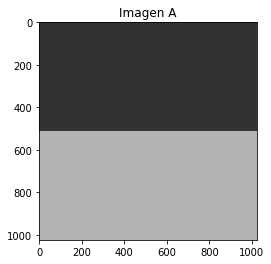

FILTRO MEDIA 3X3



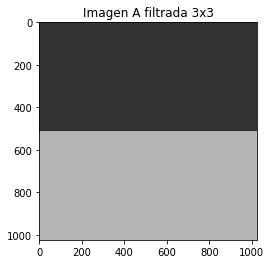


FILTRO MEDIA 5X5



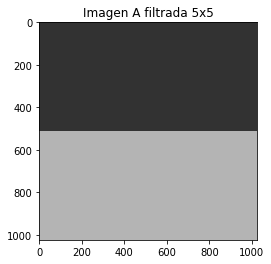


FILTRO MEDIA 11X11



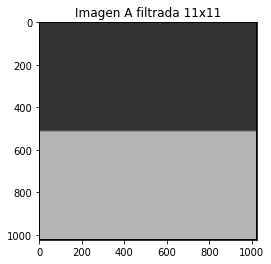

In [47]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
import statistics as stats
print('FILTROS DE MEDIA IMAGEN A')
print()

Amediaoriginal= cv2. imread ('A.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Amediaoriginal)
plt.title('Imagen A')
plt.show()
Amedia=convertirespaciodecolor(Amediaoriginal)
imAmedia=Amedia[:,:,0]
nuevaAmedia,tama,tamanu=agregarceros(imAmedia)

print('FILTRO MEDIA 3X3')
print()
Afiltradamedia3=filtromedia3x3(nuevaAmedia,tama,tamanu,Amedia)
plt.imshow(Afiltradamedia3)
plt.title('Imagen A filtrada 3x3')
plt.show()

print()
print('FILTRO MEDIA 5X5')
print()
Afiltradamedia5=filtromedia5x5(nuevaAmedia,tama,tamanu,Amedia)
plt.imshow(Afiltradamedia5)
plt.title('Imagen A filtrada 5x5')
plt.show()

print()
print('FILTRO MEDIA 11X11')
print()
Afiltradamedia11=filtromedia11x11(nuevaAmedia,tama,tamanu,Amedia)
plt.imshow(Afiltradamedia11)
plt.title('Imagen A filtrada 11x11')
plt.show()

## Imagen B

FILTROS DE MEDIA IMAGEN B



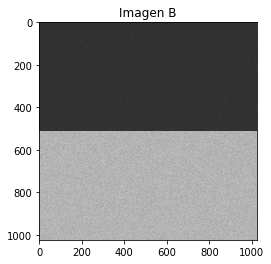

FILTRO MEDIA 3X3



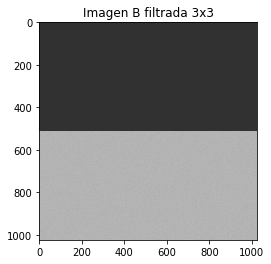


FILTRO MEDIA 5X5



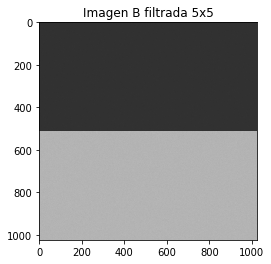


FILTRO MEDIA 11X11



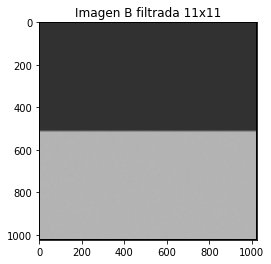

In [28]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
import statistics as stats
print('FILTROS DE MEDIA IMAGEN B')
print()

Bmediaoriginal= cv2. imread ('B.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Bmediaoriginal)
plt.title('Imagen B')
plt.show()
Bmedia=convertirespaciodecolor(Bmediaoriginal)
imBmedia=Bmedia[:,:,0]
nuevaBmedia,tama,tamanu=agregarceros(imBmedia)

print('FILTRO MEDIA 3X3')
print()
Bfiltradamedia3=filtromedia3x3(nuevaBmedia,tama,tamanu,Bmedia)
plt.imshow(Bfiltradamedia3)
plt.title('Imagen B filtrada 3x3')
plt.show()

print()
print('FILTRO MEDIA 5X5')
print()
Bfiltradamedia5=filtromedia5x5(nuevaBmedia,tama,tamanu,Bmedia)
plt.imshow(Bfiltradamedia5)
plt.title('Imagen B filtrada 5x5')
plt.show()

print()
print('FILTRO MEDIA 11X11')
print()
Bfiltradamedia11=filtromedia11x11(nuevaBmedia,tama,tamanu,Bmedia)
plt.imshow(Bfiltradamedia11)
plt.title('Imagen B filtrada 11x11')
plt.show()

## Imagen C

FILTROS DE MEDIA IMAGEN C



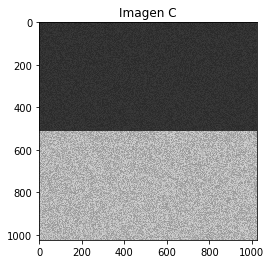

FILTRO MEDIA 3X3



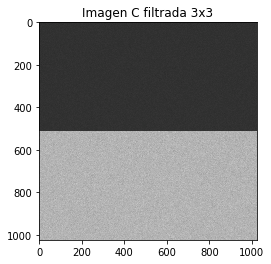


FILTRO MEDIA 5X5



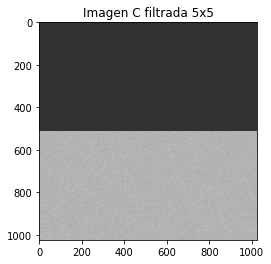


FILTRO MEDIA 11X11



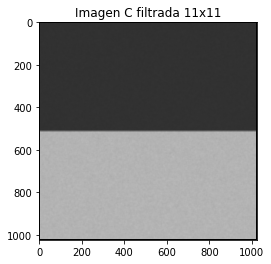

In [29]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
import statistics as stats
print('FILTROS DE MEDIA IMAGEN C')
print()

Cmediaoriginal= cv2. imread ('C.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Cmediaoriginal)
plt.title('Imagen C')
plt.show()
Cmedia=convertirespaciodecolor(Cmediaoriginal)
imCmedia=Cmedia[:,:,0]
nuevaCmedia,tama,tamanu=agregarceros(imCmedia)

print('FILTRO MEDIA 3X3')
print()
Cfiltradamedia3=filtromedia3x3(nuevaCmedia,tama,tamanu,Cmedia)
plt.imshow(Cfiltradamedia3)
plt.title('Imagen C filtrada 3x3')
plt.show()

print()
print('FILTRO MEDIA 5X5')
print()
Cfiltradamedia5=filtromedia5x5(nuevaCmedia,tama,tamanu,Cmedia)
plt.imshow(Cfiltradamedia5)
plt.title('Imagen C filtrada 5x5')
plt.show()

print()
print('FILTRO MEDIA 11X11')
print()
Cfiltradamedia11=filtromedia11x11(nuevaCmedia,tama,tamanu,Cmedia)
plt.imshow(Cfiltradamedia11)
plt.title('Imagen C filtrada 11x11')
plt.show()

## Imagen D

FILTROS DE MEDIA IMAGEN D



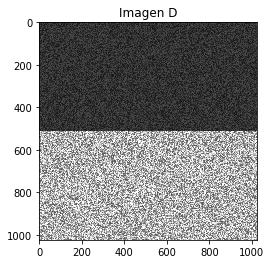

FILTRO MEDIA 3X3



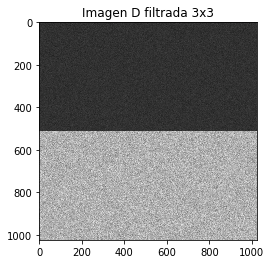


FILTRO MEDIA 5X5



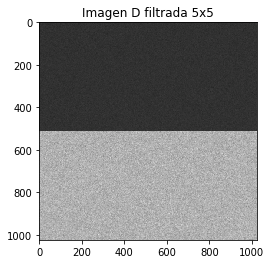


FILTRO MEDIA 11X11



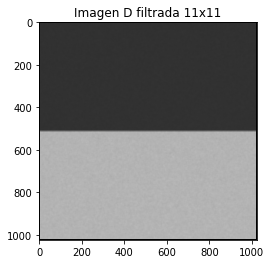

In [30]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
import statistics as stats
print('FILTROS DE MEDIA IMAGEN D')
print()

Dmediaoriginal= cv2. imread ('D.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Dmediaoriginal)
plt.title('Imagen D')
plt.show()
Dmedia=convertirespaciodecolor(Dmediaoriginal)
imDmedia=Dmedia[:,:,0]
nuevaDmedia,tama,tamanu=agregarceros(imDmedia)

print('FILTRO MEDIA 3X3')
print()
Dfiltradamedia3=filtromedia3x3(nuevaDmedia,tama,tamanu,Dmedia)
plt.imshow(Dfiltradamedia3)
plt.title('Imagen D filtrada 3x3')
plt.show()

print()
print('FILTRO MEDIA 5X5')
print()
Dfiltradamedia5=filtromedia5x5(nuevaDmedia,tama,tamanu,Dmedia)
plt.imshow(Dfiltradamedia5)
plt.title('Imagen D filtrada 5x5')
plt.show()

print()
print('FILTRO MEDIA 11X11')
print()
Dfiltradamedia11=filtromedia11x11(nuevaCmedia,tama,tamanu,Dmedia)
plt.imshow(Dfiltradamedia11)
plt.title('Imagen D filtrada 11x11')
plt.show()

## Imagen E

FILTROS DE MEDIA IMAGEN E



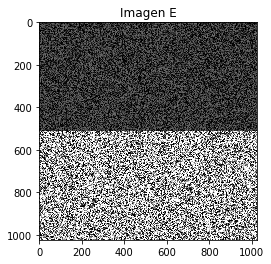

FILTRO MEDIA 3X3



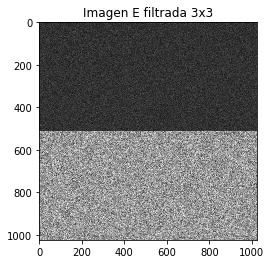


FILTRO MEDIA 5X5



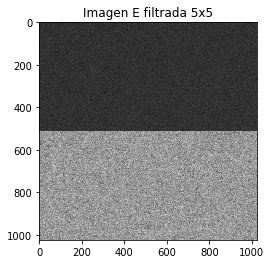


FILTRO MEDIA 11X11



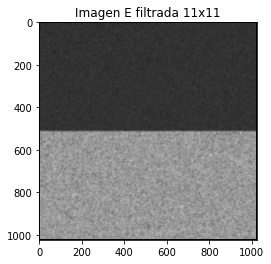

In [31]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
import statistics as stats
print('FILTROS DE MEDIA IMAGEN E')
print()

Emediaoriginal= cv2. imread ('E.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Emediaoriginal)
plt.title('Imagen E')
plt.show()
Emedia=convertirespaciodecolor(Emediaoriginal)
imEmedia=Emedia[:,:,0]
nuevaEmedia,tama,tamanu=agregarceros(imEmedia)

print('FILTRO MEDIA 3X3')
print()
Efiltradamedia3=filtromedia3x3(nuevaEmedia,tama,tamanu,Emedia)
plt.imshow(Efiltradamedia3)
plt.title('Imagen E filtrada 3x3')
plt.show()

print()
print('FILTRO MEDIA 5X5')
print()
Efiltradamedia5=filtromedia5x5(nuevaEmedia,tama,tamanu,Emedia)
plt.imshow(Efiltradamedia5)
plt.title('Imagen E filtrada 5x5')
plt.show()

print()
print('FILTRO MEDIA 11X11')
print()
Efiltradamedia11=filtromedia11x11(nuevaEmedia,tama,tamanu,Emedia)
plt.imshow(Efiltradamedia11)
plt.title('Imagen E filtrada 11x11')
plt.show()

# FILTRO MAXIMO

## Imagen A

FILTROS MAXIMO IMAGEN A



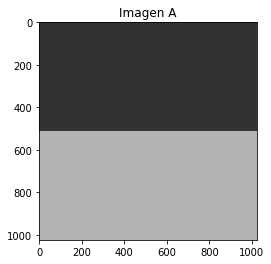

FILTRO MAXIMO 3X3



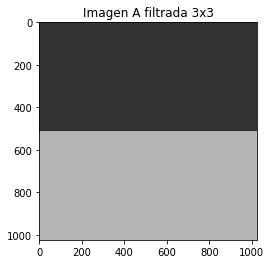


FILTRO MAXIMO 5X5



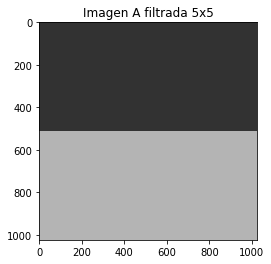


FILTRO MAXIMO 11X11



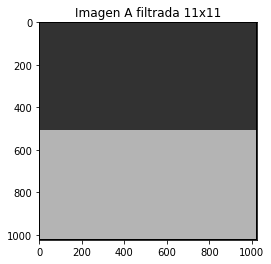

In [32]:
print('FILTROS MAXIMO IMAGEN A')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
Amaxoriginal= cv2. imread ('A.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Amaxoriginal)
plt.title('Imagen A')
plt.show()
Amax=convertirespaciodecolor(Amaxoriginal)
imAmax=Amax[:,:,0]
nuevaAmax,tama,tamanu=agregarceros(imAmax)

print('FILTRO MAXIMO 3X3')
print()
Amaxfiltrada3=filtromaximo3x3(nuevaAmax,tama,tamanu,Amax)
plt.imshow(Amaxfiltrada3)
plt.title('Imagen A filtrada 3x3')
plt.show()

print()
print('FILTRO MAXIMO 5X5')
print()
Amaxfiltrada5=filtromaximo5x5(nuevaAmax,tama,tamanu,Amax)
plt.imshow(Amaxfiltrada5)
plt.title('Imagen A filtrada 5x5')
plt.show()

print()
print('FILTRO MAXIMO 11X11')
print()
Amaxfiltrada11=filtromaximo11x11(nuevaAmax,tama,tamanu,Amax)
plt.imshow(Amaxfiltrada11)
plt.title('Imagen A filtrada 11x11')
plt.show()

## Imagen B

FILTROS MAXIMO IMAGEN B



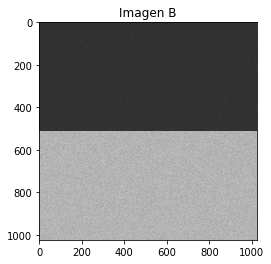

FILTRO MAXIMO 3X3



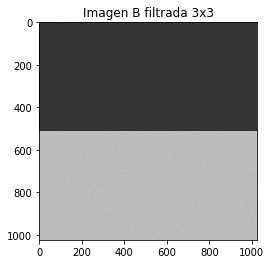


FILTRO MAXIMO 5X5



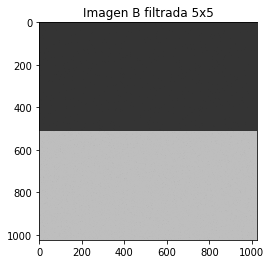


FILTRO MAXIMO 11X11



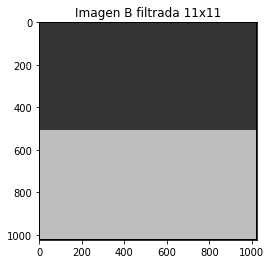

In [33]:
print('FILTROS MAXIMO IMAGEN B')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
Bmaxoriginal= cv2. imread ('B.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Bmaxoriginal)
plt.title('Imagen B')
plt.show()
Bmax=convertirespaciodecolor(Bmaxoriginal)
imBmax=Bmax[:,:,0]
nuevaBmax,tama,tamanu=agregarceros(imBmax)

print('FILTRO MAXIMO 3X3')
print()
Bmaxfiltrada3=filtromaximo3x3(nuevaBmax,tama,tamanu,Bmax)
plt.imshow(Bmaxfiltrada3)
plt.title('Imagen B filtrada 3x3')
plt.show()

print()
print('FILTRO MAXIMO 5X5')
print()
Bmaxfiltrada5=filtromaximo5x5(nuevaBmax,tama,tamanu,Bmax)
plt.imshow(Bmaxfiltrada5)
plt.title('Imagen B filtrada 5x5')
plt.show()

print()
print('FILTRO MAXIMO 11X11')
print()
Bmaxfiltrada11=filtromaximo11x11(nuevaBmax,tama,tamanu,Bmax)
plt.imshow(Bmaxfiltrada11)
plt.title('Imagen B filtrada 11x11')
plt.show()

## Imagen C

FILTROS MAXIMO IMAGEN C



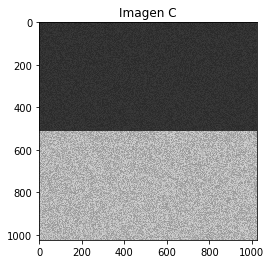

FILTRO MAXIMO 3X3



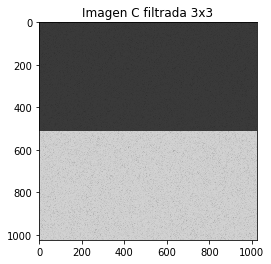


FILTRO MAXIMO 5X5



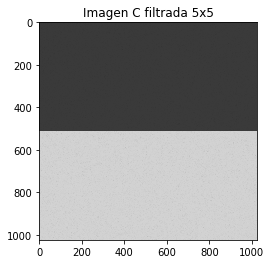


FILTRO MAXIMO 11X11



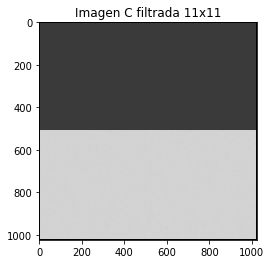

In [34]:
print('FILTROS MAXIMO IMAGEN C')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
Cmaxoriginal= cv2. imread ('C.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Cmaxoriginal)
plt.title('Imagen C')
plt.show()
Cmax=convertirespaciodecolor(Cmaxoriginal)
imCmax=Cmax[:,:,0]
nuevaCmax,tama,tamanu=agregarceros(imCmax)

print('FILTRO MAXIMO 3X3')
print()
Cmaxfiltrada3=filtromaximo3x3(nuevaCmax,tama,tamanu,Cmax)
plt.imshow(Cmaxfiltrada3)
plt.title('Imagen C filtrada 3x3')
plt.show()

print()
print('FILTRO MAXIMO 5X5')
print()
Cmaxfiltrada5=filtromaximo5x5(nuevaCmax,tama,tamanu,Cmax)
plt.imshow(Cmaxfiltrada5)
plt.title('Imagen C filtrada 5x5')
plt.show()

print()
print('FILTRO MAXIMO 11X11')
print()
Cmaxfiltrada11=filtromaximo11x11(nuevaCmax,tama,tamanu,Cmax)
plt.imshow(Cmaxfiltrada11)
plt.title('Imagen C filtrada 11x11')
plt.show()

##  Imagen D

FILTROS MAXIMO IMAGEN D



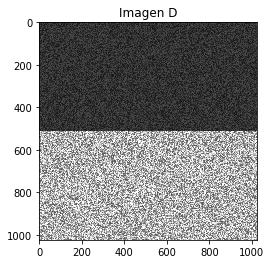

FILTRO MAXIMO 3X3



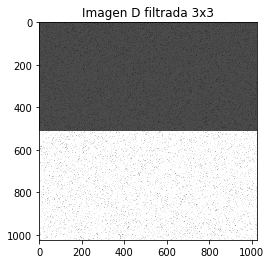


FILTRO MAXIMO 5X5



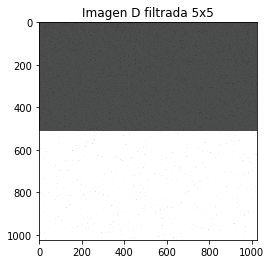


FILTRO MAXIMO 11X11



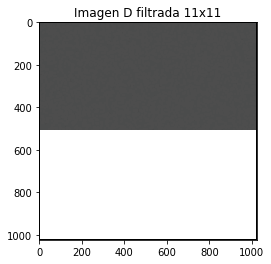

In [35]:
print('FILTROS MAXIMO IMAGEN D')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
Dmaxoriginal= cv2. imread ('D.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Dmaxoriginal)
plt.title('Imagen D')
plt.show()
Dmax=convertirespaciodecolor(Dmaxoriginal)
imDmax=Dmax[:,:,0]
nuevaDmax,tama,tamanu=agregarceros(imDmax)

print('FILTRO MAXIMO 3X3')
print()
Dmaxfiltrada3=filtromaximo3x3(nuevaDmax,tama,tamanu,Dmax)
plt.imshow(Dmaxfiltrada3)
plt.title('Imagen D filtrada 3x3')
plt.show()

print()
print('FILTRO MAXIMO 5X5')
print()
Dmaxfiltrada5=filtromaximo5x5(nuevaDmax,tama,tamanu,Dmax)
plt.imshow(Dmaxfiltrada5)
plt.title('Imagen D filtrada 5x5')
plt.show()

print()
print('FILTRO MAXIMO 11X11')
print()
Dmaxfiltrada11=filtromaximo11x11(nuevaDmax,tama,tamanu,Dmax)
plt.imshow(Dmaxfiltrada11)
plt.title('Imagen D filtrada 11x11')
plt.show()

## Imagen E

FILTROS MAXIMO IMAGEN E



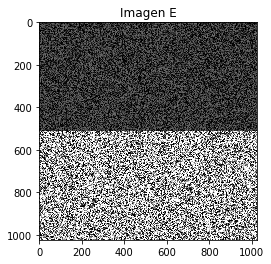

FILTRO MAXIMO 3X3



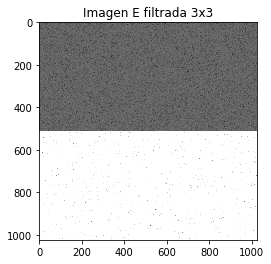


FILTRO MAXIMO 5X5



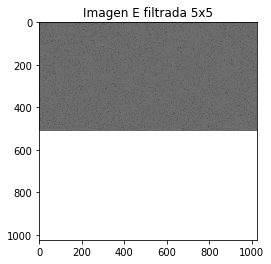


FILTRO MAXIMO 11X11



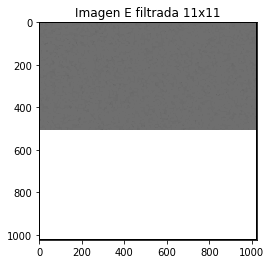

In [36]:
print('FILTROS MAXIMO IMAGEN E')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
Emaxoriginal= cv2. imread ('E.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Emaxoriginal)
plt.title('Imagen E')
plt.show()
Emax=convertirespaciodecolor(Emaxoriginal)
imEmax=Emax[:,:,0]
nuevaEmax,tama,tamanu=agregarceros(imEmax)

print('FILTRO MAXIMO 3X3')
print()
Emaxfiltrada3=filtromaximo3x3(nuevaEmax,tama,tamanu,Emax)
plt.imshow(Emaxfiltrada3)
plt.title('Imagen E filtrada 3x3')
plt.show()

print()
print('FILTRO MAXIMO 5X5')
print()
Emaxfiltrada5=filtromaximo5x5(nuevaEmax,tama,tamanu,Emax)
plt.imshow(Emaxfiltrada5)
plt.title('Imagen E filtrada 5x5')
plt.show()

print()
print('FILTRO MAXIMO 11X11')
print()
Emaxfiltrada11=filtromaximo11x11(nuevaEmax,tama,tamanu,Emax)
plt.imshow(Emaxfiltrada11)
plt.title('Imagen E filtrada 11x11')
plt.show()

# FILTRO MINIMO

## Imagen A 

FILTROS MINIMO IMAGEN A



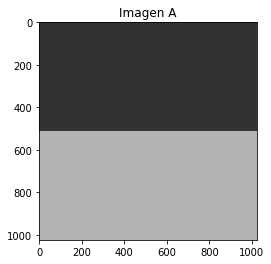

FILTRO MINIMO 3X3



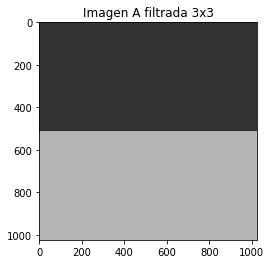


FILTRO MINIMO 5X5



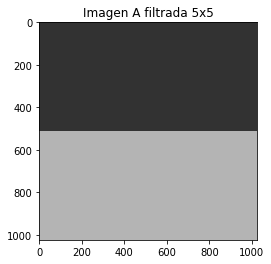


FILTRO MINIMO 11X11



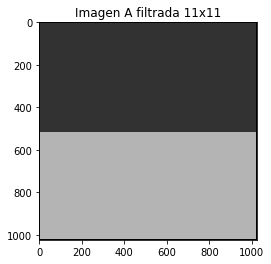

In [37]:
print('FILTROS MINIMO IMAGEN A')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
Aminoriginal= cv2. imread ('A.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Aminoriginal)
plt.title('Imagen A')
plt.show()
Amin=convertirespaciodecolor(Aminoriginal)
imAmin=Amin[:,:,0]
nuevaAmin,tama,tamanu=agregarceros(imAmin)

print('FILTRO MINIMO 3X3')
print()
Aminfiltrada3=filtrominimo3x3(nuevaAmin,tama,tamanu,Amin)
plt.imshow(Aminfiltrada3)
plt.title('Imagen A filtrada 3x3')
plt.show()

print()
print('FILTRO MINIMO 5X5')
print()
Aminfiltrada5=filtrominimo5x5(nuevaAmin,tama,tamanu,Amin)
plt.imshow(Aminfiltrada5)
plt.title('Imagen A filtrada 5x5')
plt.show()

print()
print('FILTRO MINIMO 11X11')
print()
Aminfiltrada11=filtrominimo11x11(nuevaAmin,tama,tamanu,Amin)
plt.imshow(Aminfiltrada11)
plt.title('Imagen A filtrada 11x11')
plt.show()

## Imagen B

FILTROS MINIMO IMAGEN B



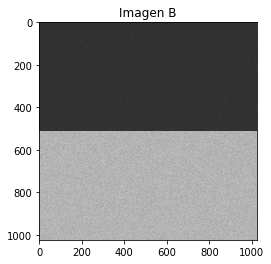

FILTRO MINIMO 3X3



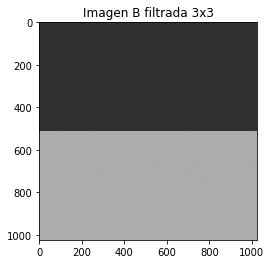


FILTRO MINIMO 5X5



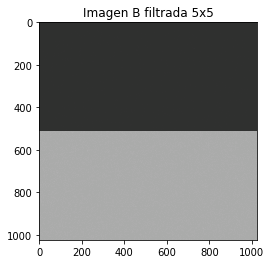


FILTRO MINIMO 11X11



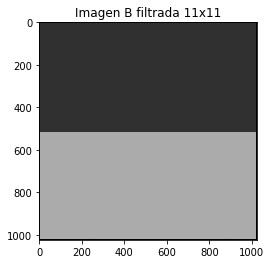

In [38]:
print('FILTROS MINIMO IMAGEN B')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
Bminoriginal= cv2. imread ('B.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Bminoriginal)
plt.title('Imagen B')
plt.show()
Bmin=convertirespaciodecolor(Bminoriginal)
imBmin=Bmin[:,:,0]
nuevaBmin,tama,tamanu=agregarceros(imBmin)

print('FILTRO MINIMO 3X3')
print()
Bminfiltrada3=filtrominimo3x3(nuevaBmin,tama,tamanu,Bmin)
plt.imshow(Bminfiltrada3)
plt.title('Imagen B filtrada 3x3')
plt.show()

print()
print('FILTRO MINIMO 5X5')
print()
Bminfiltrada5=filtrominimo5x5(nuevaBmin,tama,tamanu,Bmin)
plt.imshow(Bminfiltrada5)
plt.title('Imagen B filtrada 5x5')
plt.show()

print()
print('FILTRO MINIMO 11X11')
print()
Bminfiltrada11=filtrominimo11x11(nuevaBmin,tama,tamanu,Bmin)
plt.imshow(Bminfiltrada11)
plt.title('Imagen B filtrada 11x11')
plt.show()

## Imagen C

FILTROS MINIMO IMAGEN C



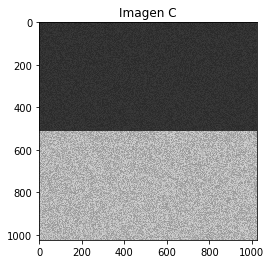

FILTRO MINIMO 3X3



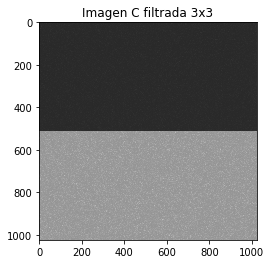


FILTRO MINIMO 5X5



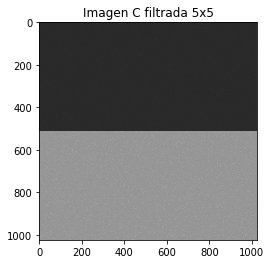


FILTRO MINIMO 11X11



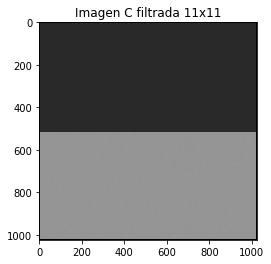

In [39]:
print('FILTROS MINIMO IMAGEN C')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
Cminoriginal= cv2. imread ('C.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Cminoriginal)
plt.title('Imagen C')
plt.show()
Cmin=convertirespaciodecolor(Cminoriginal)
imCmin=Cmin[:,:,0]
nuevaCmin,tama,tamanu=agregarceros(imCmin)

print('FILTRO MINIMO 3X3')
print()
Cminfiltrada3=filtrominimo3x3(nuevaCmin,tama,tamanu,Cmin)
plt.imshow(Cminfiltrada3)
plt.title('Imagen C filtrada 3x3')
plt.show()

print()
print('FILTRO MINIMO 5X5')
print()
Cminfiltrada5=filtrominimo5x5(nuevaCmin,tama,tamanu,Cmin)
plt.imshow(Cminfiltrada5)
plt.title('Imagen C filtrada 5x5')
plt.show()

print()
print('FILTRO MINIMO 11X11')
print()
Cminfiltrada11=filtrominimo11x11(nuevaCmin,tama,tamanu,Cmin)
plt.imshow(Cminfiltrada11)
plt.title('Imagen C filtrada 11x11')
plt.show()

## Imagen D

FILTROS MINIMO IMAGEN D



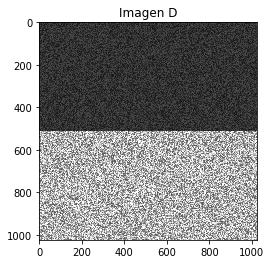

FILTRO MINIMO 3X3



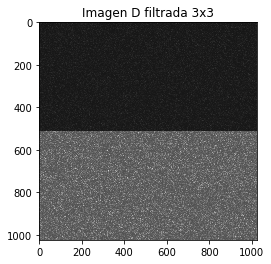


FILTRO MINIMO 5X5



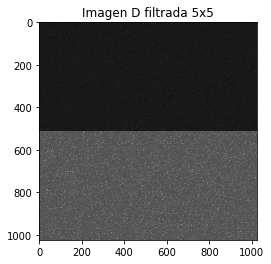


FILTRO MINIMO 11X11



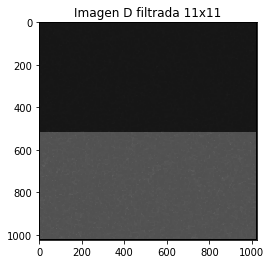

In [40]:
print('FILTROS MINIMO IMAGEN D')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
Dminoriginal= cv2. imread ('D.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Dminoriginal)
plt.title('Imagen D')
plt.show()
Dmin=convertirespaciodecolor(Dminoriginal)
imDmin=Dmin[:,:,0]
nuevaDmin,tama,tamanu=agregarceros(imDmin)

print('FILTRO MINIMO 3X3')
print()
Dminfiltrada3=filtrominimo3x3(nuevaDmin,tama,tamanu,Dmin)
plt.imshow(Dminfiltrada3)
plt.title('Imagen D filtrada 3x3')
plt.show()

print()
print('FILTRO MINIMO 5X5')
print()
Dminfiltrada5=filtrominimo5x5(nuevaDmin,tama,tamanu,Dmin)
plt.imshow(Dminfiltrada5)
plt.title('Imagen D filtrada 5x5')
plt.show()

print()
print('FILTRO MINIMO 11X11')
print()
Dminfiltrada11=filtrominimo11x11(nuevaDmin,tama,tamanu,Dmin)
plt.imshow(Dminfiltrada11)
plt.title('Imagen D filtrada 11x11')
plt.show()

## Imagen E

FILTROS MINIMO IMAGEN E



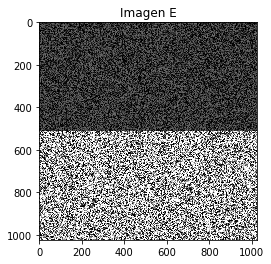

FILTRO MINIMO 3X3



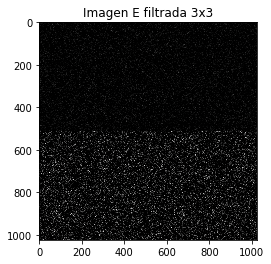


FILTRO MINIMO 5X5



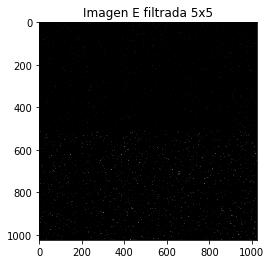


FILTRO MINIMO 11X11



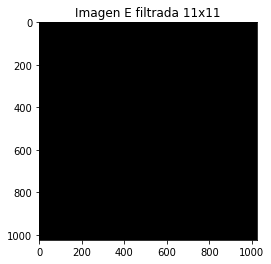

In [41]:
print('FILTROS MINIMO IMAGEN E')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
Eminoriginal= cv2. imread ('E.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Eminoriginal)
plt.title('Imagen E')
plt.show()
Emin=convertirespaciodecolor(Eminoriginal)
imEmin=Emin[:,:,0]
nuevaEmin,tama,tamanu=agregarceros(imEmin)

print('FILTRO MINIMO 3X3')
print()
Eminfiltrada3=filtrominimo3x3(nuevaEmin,tama,tamanu,Emin)
plt.imshow(Eminfiltrada3)
plt.title('Imagen E filtrada 3x3')
plt.show()

print()
print('FILTRO MINIMO 5X5')
print()
Eminfiltrada5=filtrominimo5x5(nuevaEmin,tama,tamanu,Emin)
plt.imshow(Eminfiltrada5)
plt.title('Imagen E filtrada 5x5')
plt.show()

print()
print('FILTRO MINIMO 11X11')
print()
Eminfiltrada11=filtrominimo11x11(nuevaEmin,tama,tamanu,Emin)
plt.imshow(Eminfiltrada11)
plt.title('Imagen E filtrada 11x11')
plt.show()

# FILTRO DE MEDIANA

## Imagen A 

FILTROS DE MEDIANA IMAGEN A



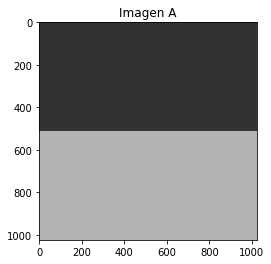

FILTRO MEDIANA 3X3



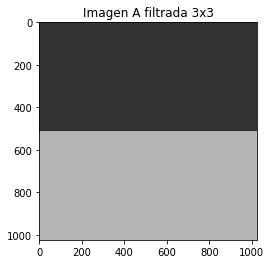


FILTRO MEDIANA 5X5



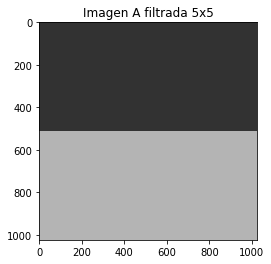


FILTRO MEDIANA 11X11



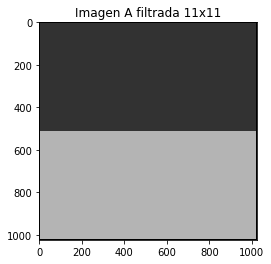

In [65]:
print('FILTROS DE MEDIANA IMAGEN A')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
Amedianaoriginal= cv2. imread ('A.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Amedianaoriginal)
plt.title('Imagen A')
plt.show()
Amediana=convertirespaciodecolor(Amedianaoriginal)
imAmediana=Amediana[:,:,0]
nuevaAmediana,tama,tamanu=agregarceros(imAmediana)

print('FILTRO MEDIANA 3X3')
print()
Amedianafiltrada3=filtromediana3x3(nuevaAmediana,tama,tamanu,Amediana)
plt.imshow(Amedianafiltrada3)
plt.title('Imagen A filtrada 3x3')
plt.show()

print()
print('FILTRO MEDIANA 5X5')
print()
Amedianafiltrada5=filtromediana5x5(nuevaAmediana,tama,tamanu,Amediana)
plt.imshow(Amedianafiltrada5)
plt.title('Imagen A filtrada 5x5')
plt.show()

print()
print('FILTRO MEDIANA 11X11')
print()
Amedianafiltrada11=filtromediana11x11(nuevaAmediana,tama,tamanu,Amediana)
plt.imshow(Amedianafiltrada11)
plt.title('Imagen A filtrada 11x11')
plt.show()

## Imagen B

FILTROS DE MEDIANA IMAGEN B



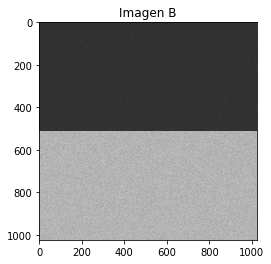

FILTRO MEDIANA 3X3



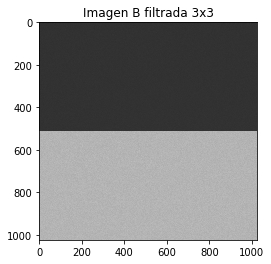


FILTRO MEDIANA 5X5



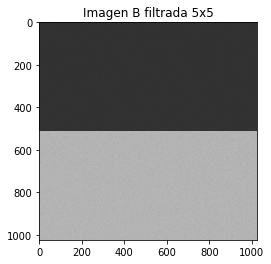


FILTRO MEDIANA 11X11



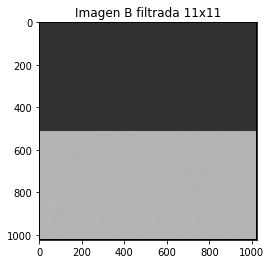

In [42]:
print('FILTROS DE MEDIANA IMAGEN B')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
Bmedianaoriginal= cv2. imread ('B.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Bmedianaoriginal)
plt.title('Imagen B')
plt.show()
Bmediana=convertirespaciodecolor(Bmedianaoriginal)
imBmediana=Bmediana[:,:,0]
nuevaBmediana,tama,tamanu=agregarceros(imBmediana)

print('FILTRO MEDIANA 3X3')
print()
Bmedianafiltrada3=filtromediana3x3(nuevaBmediana,tama,tamanu,Bmediana)
plt.imshow(Bmedianafiltrada3)
plt.title('Imagen B filtrada 3x3')
plt.show()

print()
print('FILTRO MEDIANA 5X5')
print()
Bmedianafiltrada5=filtromediana5x5(nuevaBmediana,tama,tamanu,Bmediana)
plt.imshow(Bmedianafiltrada5)
plt.title('Imagen B filtrada 5x5')
plt.show()

print()
print('FILTRO MEDIANA 11X11')
print()
Bmedianafiltrada11=filtromediana11x11(nuevaBmediana,tama,tamanu,Bmediana)
plt.imshow(Bmedianafiltrada11)
plt.title('Imagen B filtrada 11x11')
plt.show()

## Imagen C

FILTROS DE MEDIANA IMAGEN C



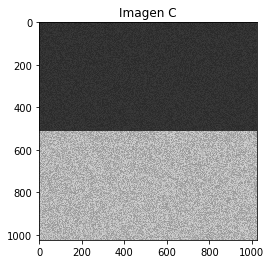

FILTRO MEDIANA 3X3



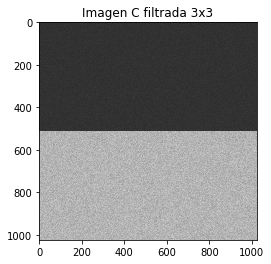


FILTRO MEDIANA 5X5



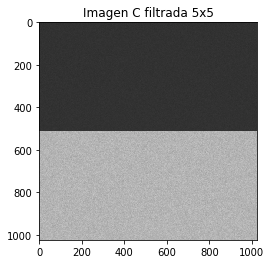


FILTRO MEDIANA 11X11



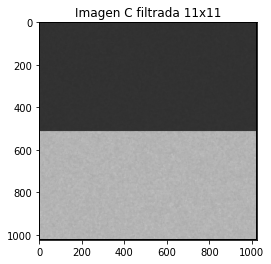

In [43]:
print('FILTROS DE MEDIANA IMAGEN C')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
Cmedianaoriginal= cv2. imread ('C.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Cmedianaoriginal)
plt.title('Imagen C')
plt.show()
Cmediana=convertirespaciodecolor(Cmedianaoriginal)
imCmediana=Cmediana[:,:,0]
nuevaCmediana,tama,tamanu=agregarceros(imCmediana)

print('FILTRO MEDIANA 3X3')
print()
Cmedianafiltrada3=filtromediana3x3(nuevaCmediana,tama,tamanu,Cmediana)
plt.imshow(Cmedianafiltrada3)
plt.title('Imagen C filtrada 3x3')
plt.show()

print()
print('FILTRO MEDIANA 5X5')
print()
Cmedianafiltrada5=filtromediana5x5(nuevaCmediana,tama,tamanu,Cmediana)
plt.imshow(Cmedianafiltrada5)
plt.title('Imagen C filtrada 5x5')
plt.show()

print()
print('FILTRO MEDIANA 11X11')
print()
Cmedianafiltrada11=filtromediana11x11(nuevaCmediana,tama,tamanu,Cmediana)
plt.imshow(Cmedianafiltrada11)
plt.title('Imagen C filtrada 11x11')
plt.show()

## Imagen D

FILTROS DE MEDIANA IMAGEN D



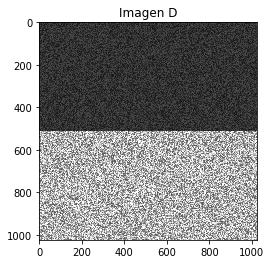

FILTRO MEDIANA 3X3



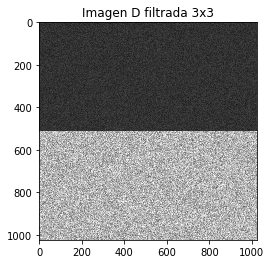


FILTRO MEDIANA 5X5



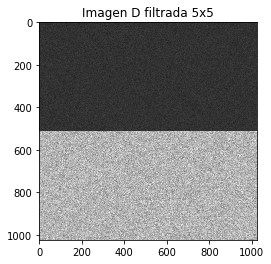


FILTRO MEDIANA 11X11



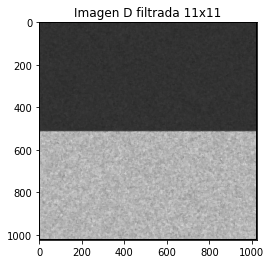

In [44]:
print('FILTROS DE MEDIANA IMAGEN D')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
Dmedianaoriginal= cv2. imread ('D.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Dmedianaoriginal)
plt.title('Imagen D')
plt.show()
Dmediana=convertirespaciodecolor(Dmedianaoriginal)
imDmediana=Dmediana[:,:,0]
nuevaDmediana,tama,tamanu=agregarceros(imDmediana)

print('FILTRO MEDIANA 3X3')
print()
Dmedianafiltrada3=filtromediana3x3(nuevaDmediana,tama,tamanu,Dmediana)
plt.imshow(Dmedianafiltrada3)
plt.title('Imagen D filtrada 3x3')
plt.show()

print()
print('FILTRO MEDIANA 5X5')
print()
Dmedianafiltrada5=filtromediana5x5(nuevaDmediana,tama,tamanu,Dmediana)
plt.imshow(Dmedianafiltrada5)
plt.title('Imagen D filtrada 5x5')
plt.show()

print()
print('FILTRO MEDIANA 11X11')
print()
Dmedianafiltrada11=filtromediana11x11(nuevaDmediana,tama,tamanu,Dmediana)
plt.imshow(Dmedianafiltrada11)
plt.title('Imagen D filtrada 11x11')
plt.show()

## Imagen E

FILTROS DE MEDIANA IMAGEN E



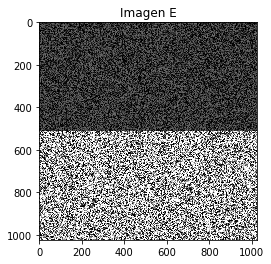

FILTRO MEDIANA 3X3



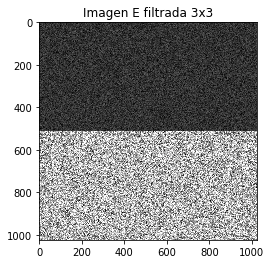


FILTRO MEDIANA 5X5



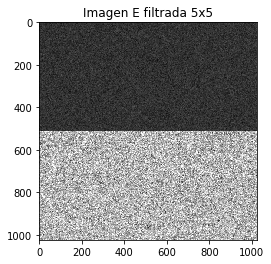


FILTRO MEDIANA 11X11



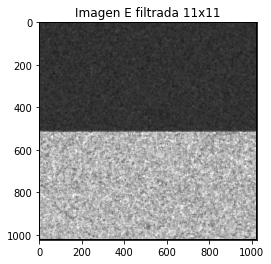

In [45]:
print('FILTROS DE MEDIANA IMAGEN E')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
Emedianaoriginal= cv2. imread ('E.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Emedianaoriginal)
plt.title('Imagen E')
plt.show()
Emediana=convertirespaciodecolor(Emedianaoriginal)
imEmediana=Emediana[:,:,0]
nuevaEmediana,tama,tamanu=agregarceros(imEmediana)

print('FILTRO MEDIANA 3X3')
print()
Emedianafiltrada3=filtromediana3x3(nuevaEmediana,tama,tamanu,Emediana)
plt.imshow(Emedianafiltrada3)
plt.title('Imagen E filtrada 3x3')
plt.show()

print()
print('FILTRO MEDIANA 5X5')
print()
Emedianafiltrada5=filtromediana5x5(nuevaEmediana,tama,tamanu,Emediana)
plt.imshow(Emedianafiltrada5)
plt.title('Imagen E filtrada 5x5')
plt.show()

print()
print('FILTRO MEDIANA 11X11')
print()
Emedianafiltrada11=filtromediana11x11(nuevaEmediana,tama,tamanu,Emediana)
plt.imshow(Emedianafiltrada11)
plt.title('Imagen E filtrada 11x11')
plt.show()

# FILTRO MEDIANA PONDERADA

## Imagen A

FILTROS DE MEDIANA PONDERADA IMAGEN A



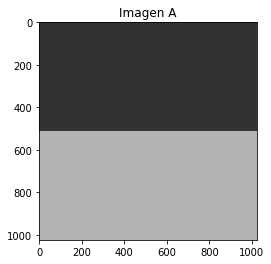

FILTRO MEDIANA PONDERADA 3X3



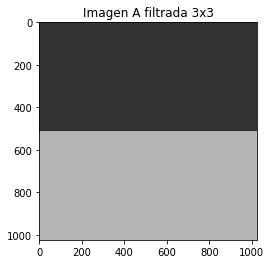


FILTRO MEDIANA PONDERADA 5X5



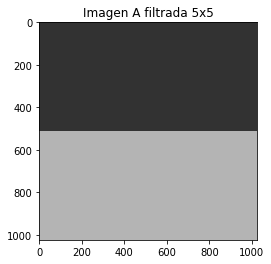


FILTRO MEDIANA PONDERADA 11X11



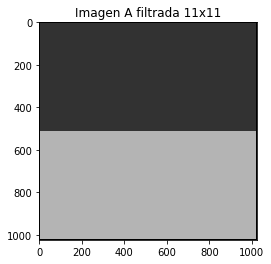

In [70]:
print('FILTROS DE MEDIANA PONDERADA IMAGEN A')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
mascara3x3=np.array ([[1,2,1],[2,4,2],[1,2,1]])
mascara5x5=np.array([[0,1,2,1,0],[1,3,5,3,1],[2,5,9,5,2],[1,3,5,3,1],[0,1,2,1,0]])
mascara11x11=np.array([[0,1,2,3,4,5,4,3,2,1,0],[1,2,3,4,5,10,5,4,3,2,1],[2,3,4,5,10,15,10,5,4,3,2],[3,4,5,10,15,20,15,10,5,4,3],[4,5,10,15,20,25,20,15,10,5,4],[5,10,15,20,25,30,25,20,15,10,5],[4,5,10,15,20,25,20,15,10,5,4],[3,4,5,10,15,20,15,10,5,4,3],[2,3,4,5,10,15,10,5,4,3,2],[1,2,3,4,5,10,5,4,3,2,1],[0,1,2,3,4,5,4,3,2,1,0]])

Amedianaponderadaoriginal= cv2. imread ('A.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Amedianaponderadaoriginal)
plt.title('Imagen A')
plt.show()
Amedianaponderada=convertirespaciodecolor(Amedianaponderadaoriginal)
imAmedianaponderada=Amedianaponderada[:,:,0]
nuevaAmedianaponderada,tama,tamanu=agregarceros(imAmedianaponderada)

print('FILTRO MEDIANA PONDERADA 3X3')
print()
Amedianaponderadafiltrada3=filtromedianaponderada3x3(nuevaAmedianaponderada,tama,tamanu,Amedianaponderada,mascara3x3)
plt.imshow(Amedianaponderadafiltrada3)
plt.title('Imagen A filtrada 3x3')
plt.show()

print()
print('FILTRO MEDIANA PONDERADA 5X5')
print()
Amedianaponderadafiltrada5=filtromedianaponderada5x5(nuevaAmedianaponderada,tama,tamanu,Amedianaponderada,mascara5x5)
plt.imshow(Amedianaponderadafiltrada5)
plt.title('Imagen A filtrada 5x5')
plt.show()

print()
print('FILTRO MEDIANA PONDERADA 11X11')
print()
Amedianaponderadafiltrada11=filtromedianaponderada11x11(nuevaAmedianaponderada,tama,tamanu,Amedianaponderada,mascara11x11)
plt.imshow(Amedianaponderadafiltrada11)
plt.title('Imagen A filtrada 11x11')
plt.show()

## Imagen B

FILTROS DE MEDIANA PONDERADA IMAGEN B



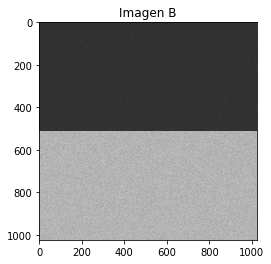

FILTRO MEDIANA PONDERADA 3X3



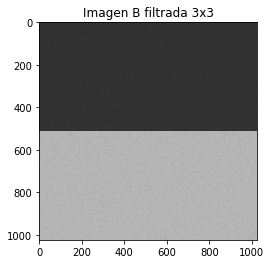


FILTRO MEDIANA PONDERADA 5X5



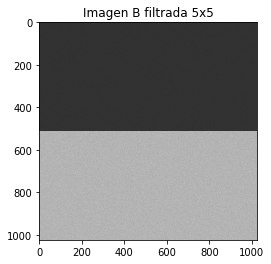


FILTRO MEDIANA PONDERADA 11X11



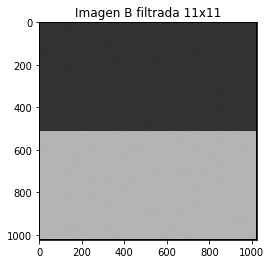

In [46]:
print('FILTROS DE MEDIANA PONDERADA IMAGEN B')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
mascara3x3=np.array ([[1,2,1],[2,4,2],[1,2,1]])
mascara5x5=np.array([[0,1,2,1,0],[1,3,5,3,1],[2,5,9,5,2],[1,3,5,3,1],[0,1,2,1,0]])
mascara11x11=np.array([[0,1,2,3,4,5,4,3,2,1,0],[1,2,3,4,5,10,5,4,3,2,1],[2,3,4,5,10,15,10,5,4,3,2],[3,4,5,10,15,20,15,10,5,4,3],[4,5,10,15,20,25,20,15,10,5,4],[5,10,15,20,25,30,25,20,15,10,5],[4,5,10,15,20,25,20,15,10,5,4],[3,4,5,10,15,20,15,10,5,4,3],[2,3,4,5,10,15,10,5,4,3,2],[1,2,3,4,5,10,5,4,3,2,1],[0,1,2,3,4,5,4,3,2,1,0]])

Bmedianaponderadaoriginal= cv2. imread ('B.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Bmedianaponderadaoriginal)
plt.title('Imagen B')
plt.show()
Bmedianaponderada=convertirespaciodecolor(Bmedianaponderadaoriginal)
imBmedianaponderada=Bmedianaponderada[:,:,0]
nuevaBmedianaponderada,tama,tamanu=agregarceros(imBmedianaponderada)

print('FILTRO MEDIANA PONDERADA 3X3')
print()
Bmedianaponderadafiltrada3=filtromedianaponderada3x3(nuevaBmedianaponderada,tama,tamanu,Bmedianaponderada,mascara3x3)
plt.imshow(Bmedianaponderadafiltrada3)
plt.title('Imagen B filtrada 3x3')
plt.show()

print()
print('FILTRO MEDIANA PONDERADA 5X5')
print()
Bmedianaponderadafiltrada5=filtromedianaponderada5x5(nuevaBmedianaponderada,tama,tamanu,Bmedianaponderada,mascara5x5)
plt.imshow(Bmedianaponderadafiltrada5)
plt.title('Imagen B filtrada 5x5')
plt.show()

print()
print('FILTRO MEDIANA PONDERADA 11X11')
print()
Bmedianaponderadafiltrada11=filtromedianaponderada11x11(nuevaBmedianaponderada,tama,tamanu,Bmedianaponderada,mascara11x11)
plt.imshow(Bmedianaponderadafiltrada11)
plt.title('Imagen B filtrada 11x11')
plt.show()

## Imagen C

FILTROS DE MEDIANA PONDERADA IMAGEN C



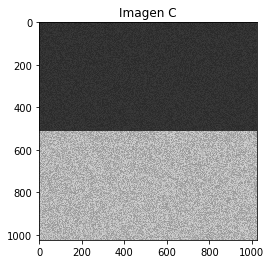

FILTRO MEDIANA PONDERADA 3X3



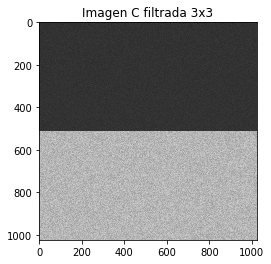


FILTRO MEDIANA PONDERADA 5X5



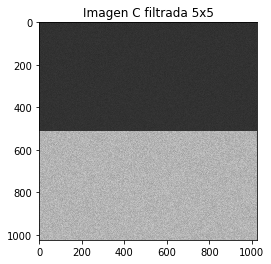


FILTRO MEDIANA PONDERADA 11X11



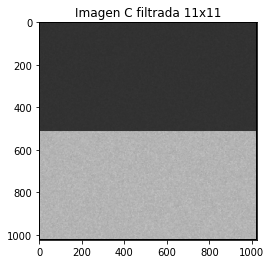

In [48]:
print('FILTROS DE MEDIANA PONDERADA IMAGEN C')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
mascara3x3=np.array ([[1,2,1],[2,4,2],[1,2,1]])
mascara5x5=np.array([[0,1,2,1,0],[1,3,5,3,1],[2,5,9,5,2],[1,3,5,3,1],[0,1,2,1,0]])
mascara11x11=np.array([[0,1,2,3,4,5,4,3,2,1,0],[1,2,3,4,5,10,5,4,3,2,1],[2,3,4,5,10,15,10,5,4,3,2],[3,4,5,10,15,20,15,10,5,4,3],[4,5,10,15,20,25,20,15,10,5,4],[5,10,15,20,25,30,25,20,15,10,5],[4,5,10,15,20,25,20,15,10,5,4],[3,4,5,10,15,20,15,10,5,4,3],[2,3,4,5,10,15,10,5,4,3,2],[1,2,3,4,5,10,5,4,3,2,1],[0,1,2,3,4,5,4,3,2,1,0]])

Cmedianaponderadaoriginal= cv2. imread ('C.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Cmedianaponderadaoriginal)
plt.title('Imagen C')
plt.show()
Cmedianaponderada=convertirespaciodecolor(Cmedianaponderadaoriginal)
imCmedianaponderada=Cmedianaponderada[:,:,0]
nuevaCmedianaponderada,tama,tamanu=agregarceros(imCmedianaponderada)

print('FILTRO MEDIANA PONDERADA 3X3')
print()
Cmedianaponderadafiltrada3=filtromedianaponderada3x3(nuevaCmedianaponderada,tama,tamanu,Cmedianaponderada,mascara3x3)
plt.imshow(Cmedianaponderadafiltrada3)
plt.title('Imagen C filtrada 3x3')
plt.show()

print()
print('FILTRO MEDIANA PONDERADA 5X5')
print()
Cmedianaponderadafiltrada5=filtromedianaponderada5x5(nuevaCmedianaponderada,tama,tamanu,Cmedianaponderada,mascara5x5)
plt.imshow(Cmedianaponderadafiltrada5)
plt.title('Imagen C filtrada 5x5')
plt.show()

print()
print('FILTRO MEDIANA PONDERADA 11X11')
print()
Cmedianaponderadafiltrada11=filtromedianaponderada11x11(nuevaCmedianaponderada,tama,tamanu,Cmedianaponderada,mascara11x11)
plt.imshow(Cmedianaponderadafiltrada11)
plt.title('Imagen C filtrada 11x11')
plt.show()

## Imagen D

FILTROS DE MEDIANA PONDERADA IMAGEN D



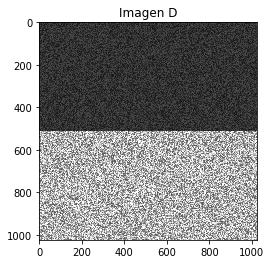

FILTRO MEDIANA PONDERADA 3X3



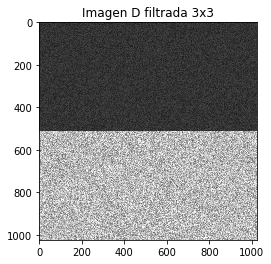


FILTRO MEDIANA PONDERADA 5X5



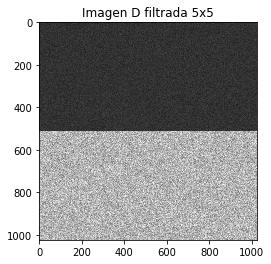


FILTRO MEDIANA PONDERADA 11X11



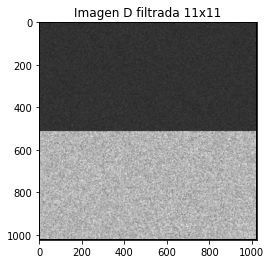

In [49]:
print('FILTROS DE MEDIANA PONDERADA IMAGEN D')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
mascara3x3=np.array ([[1,2,1],[2,4,2],[1,2,1]])
mascara5x5=np.array([[0,1,2,1,0],[1,3,5,3,1],[2,5,9,5,2],[1,3,5,3,1],[0,1,2,1,0]])
mascara11x11=np.array([[0,1,2,3,4,5,4,3,2,1,0],[1,2,3,4,5,10,5,4,3,2,1],[2,3,4,5,10,15,10,5,4,3,2],[3,4,5,10,15,20,15,10,5,4,3],[4,5,10,15,20,25,20,15,10,5,4],[5,10,15,20,25,30,25,20,15,10,5],[4,5,10,15,20,25,20,15,10,5,4],[3,4,5,10,15,20,15,10,5,4,3],[2,3,4,5,10,15,10,5,4,3,2],[1,2,3,4,5,10,5,4,3,2,1],[0,1,2,3,4,5,4,3,2,1,0]])

Dmedianaponderadaoriginal= cv2. imread ('D.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Dmedianaponderadaoriginal)
plt.title('Imagen D')
plt.show()
Dmedianaponderada=convertirespaciodecolor(Dmedianaponderadaoriginal)
imDmedianaponderada=Dmedianaponderada[:,:,0]
nuevaDmedianaponderada,tama,tamanu=agregarceros(imDmedianaponderada)

print('FILTRO MEDIANA PONDERADA 3X3')
print()
Dmedianaponderadafiltrada3=filtromedianaponderada3x3(nuevaDmedianaponderada,tama,tamanu,Dmedianaponderada,mascara3x3)
plt.imshow(Dmedianaponderadafiltrada3)
plt.title('Imagen D filtrada 3x3')
plt.show()

print()
print('FILTRO MEDIANA PONDERADA 5X5')
print()
Dmedianaponderadafiltrada5=filtromedianaponderada5x5(nuevaDmedianaponderada,tama,tamanu,Dmedianaponderada,mascara5x5)
plt.imshow(Dmedianaponderadafiltrada5)
plt.title('Imagen D filtrada 5x5')
plt.show()

print()
print('FILTRO MEDIANA PONDERADA 11X11')
print()
Dmedianaponderadafiltrada11=filtromedianaponderada11x11(nuevaDmedianaponderada,tama,tamanu,Dmedianaponderada,mascara11x11)
plt.imshow(Dmedianaponderadafiltrada11)
plt.title('Imagen D filtrada 11x11')
plt.show()

## Imagen E

FILTROS DE MEDIANA PONDERADA IMAGEN E



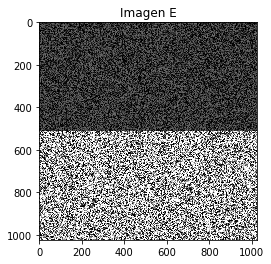

FILTRO MEDIANA PONDERADA 3X3



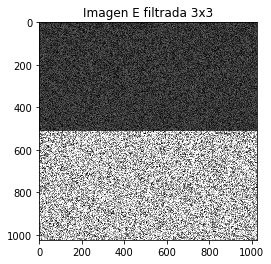


FILTRO MEDIANA PONDERADA 5X5



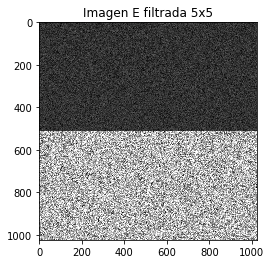


FILTRO MEDIANA PONDERADA 11X11



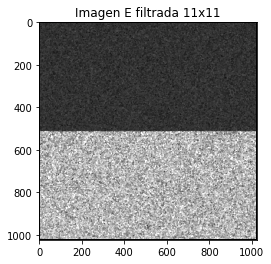

In [50]:
print('FILTROS DE MEDIANA PONDERADA IMAGEN E')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
mascara3x3=np.array ([[1,2,1],[2,4,2],[1,2,1]])
mascara5x5=np.array([[0,1,2,1,0],[1,3,5,3,1],[2,5,9,5,2],[1,3,5,3,1],[0,1,2,1,0]])
mascara11x11=np.array([[0,1,2,3,4,5,4,3,2,1,0],[1,2,3,4,5,10,5,4,3,2,1],[2,3,4,5,10,15,10,5,4,3,2],[3,4,5,10,15,20,15,10,5,4,3],[4,5,10,15,20,25,20,15,10,5,4],[5,10,15,20,25,30,25,20,15,10,5],[4,5,10,15,20,25,20,15,10,5,4],[3,4,5,10,15,20,15,10,5,4,3],[2,3,4,5,10,15,10,5,4,3,2],[1,2,3,4,5,10,5,4,3,2,1],[0,1,2,3,4,5,4,3,2,1,0]])

Emedianaponderadaoriginal= cv2. imread ('E.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Emedianaponderadaoriginal)
plt.title('Imagen E')
plt.show()
Emedianaponderada=convertirespaciodecolor(Emedianaponderadaoriginal)
imEmedianaponderada=Emedianaponderada[:,:,0]
nuevaEmedianaponderada,tama,tamanu=agregarceros(imEmedianaponderada)

print('FILTRO MEDIANA PONDERADA 3X3')
print()
Emedianaponderadafiltrada3=filtromedianaponderada3x3(nuevaEmedianaponderada,tama,tamanu,Emedianaponderada,mascara3x3)
plt.imshow(Emedianaponderadafiltrada3)
plt.title('Imagen E filtrada 3x3')
plt.show()

print()
print('FILTRO MEDIANA PONDERADA 5X5')
print()
Emedianaponderadafiltrada5=filtromedianaponderada5x5(nuevaEmedianaponderada,tama,tamanu,Emedianaponderada,mascara5x5)
plt.imshow(Emedianaponderadafiltrada5)
plt.title('Imagen E filtrada 5x5')
plt.show()

print()
print('FILTRO MEDIANA PONDERADA 11X11')
print()
Emedianaponderadafiltrada11=filtromedianaponderada11x11(nuevaEmedianaponderada,tama,tamanu,Emedianaponderada,mascara11x11)
plt.imshow(Emedianaponderadafiltrada11)
plt.title('Imagen E filtrada 11x11')
plt.show()

# FILTRO GAUSSIANO

## Imagen A

FILTROS GAUSSIANO IMAGEN A



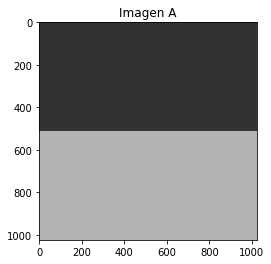

FILTRO GAUSSIANO 3X3



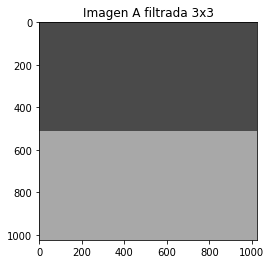


FILTRO GAUSSIANO 5X5



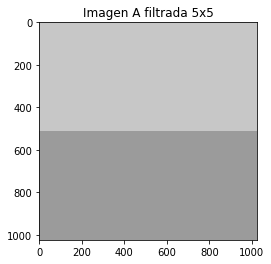


FILTRO GAUSSIANO 11X11



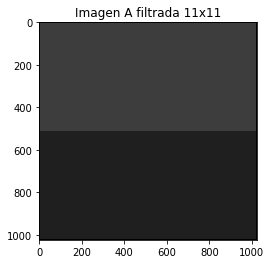

In [73]:
print('FILTROS GAUSSIANO IMAGEN A')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
mascara3x3=np.array ([[1,2,1],[2,4,2],[1,2,1]])
mascara5x5=np.array([[0,1,2,1,0],[1,3,5,3,1],[2,5,9,5,2],[1,3,5,3,1],[0,1,2,1,0]])
mascara11x11=np.array([[0,1,2,3,4,5,4,3,2,1,0],[1,2,3,4,5,10,5,4,3,2,1],[2,3,4,5,10,15,10,5,4,3,2],[3,4,5,10,15,20,15,10,5,4,3],[4,5,10,15,20,25,20,15,10,5,4],[5,10,15,20,25,30,25,20,15,10,5],[4,5,10,15,20,25,20,15,10,5,4],[3,4,5,10,15,20,15,10,5,4,3],[2,3,4,5,10,15,10,5,4,3,2],[1,2,3,4,5,10,5,4,3,2,1],[0,1,2,3,4,5,4,3,2,1,0]])

Agaussianooriginal= cv2. imread ('A.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Agaussianooriginal)
plt.title('Imagen A')
plt.show()
Agaussiano=convertirespaciodecolor(Agaussianooriginal)
imAgaussiano=Agaussiano[:,:,0]
nuevaAgaussiano,tama,tamanu=agregarceros(imAgaussiano)

print('FILTRO GAUSSIANO 3X3')
print()
Agaussianofiltrada3=filtrogaussiano3x3(nuevaAgaussiano,tama,tamanu,Agaussiano,mascara3x3)
plt.imshow(Agaussianofiltrada3)
plt.title('Imagen A filtrada 3x3')
plt.show()

print()
print('FILTRO GAUSSIANO 5X5')
print()
Agaussianofiltrada5=filtrogaussiano5x5(nuevaAgaussiano,tama,tamanu,Agaussiano,mascara5x5)
plt.imshow(Agaussianofiltrada5)
plt.title('Imagen A filtrada 5x5')
plt.show()

print()
print('FILTRO GAUSSIANO 11X11')
print()
Agaussianofiltrada11=filtrogaussiano11x11(nuevaAgaussiano,tama,tamanu,Agaussiano,mascara11x11)
plt.imshow(Agaussianofiltrada11)
plt.title('Imagen A filtrada 11x11')
plt.show()

## Imagen B

FILTROS GAUSSIANO IMAGEN B



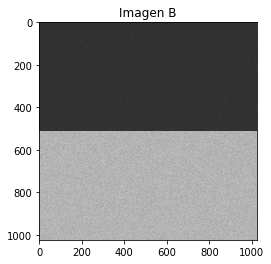

FILTRO GAUSSIANO 3X3



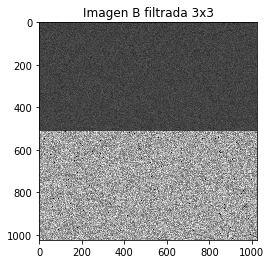


FILTRO GAUSSIANO 5X5



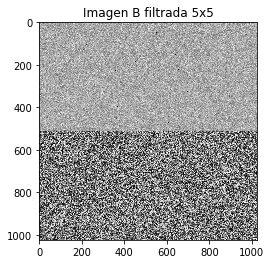


FILTRO GAUSSIANO 11X11



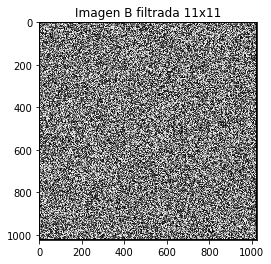

In [51]:
print('FILTROS GAUSSIANO IMAGEN B')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
mascara3x3=np.array ([[1,2,1],[2,4,2],[1,2,1]])
mascara5x5=np.array([[0,1,2,1,0],[1,3,5,3,1],[2,5,9,5,2],[1,3,5,3,1],[0,1,2,1,0]])
mascara11x11=np.array([[0,1,2,3,4,5,4,3,2,1,0],[1,2,3,4,5,10,5,4,3,2,1],[2,3,4,5,10,15,10,5,4,3,2],[3,4,5,10,15,20,15,10,5,4,3],[4,5,10,15,20,25,20,15,10,5,4],[5,10,15,20,25,30,25,20,15,10,5],[4,5,10,15,20,25,20,15,10,5,4],[3,4,5,10,15,20,15,10,5,4,3],[2,3,4,5,10,15,10,5,4,3,2],[1,2,3,4,5,10,5,4,3,2,1],[0,1,2,3,4,5,4,3,2,1,0]])

Bgaussianooriginal= cv2. imread ('B.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Bgaussianooriginal)
plt.title('Imagen B')
plt.show()
Bgaussiano=convertirespaciodecolor(Bgaussianooriginal)
imBgaussiano=Bgaussiano[:,:,0]
nuevaBgaussiano,tama,tamanu=agregarceros(imBgaussiano)

print('FILTRO GAUSSIANO 3X3')
print()
Bgaussianofiltrada3=filtrogaussiano3x3(nuevaBgaussiano,tama,tamanu,Bgaussiano,mascara3x3)
plt.imshow(Bgaussianofiltrada3)
plt.title('Imagen B filtrada 3x3')
plt.show()

print()
print('FILTRO GAUSSIANO 5X5')
print()
Bgaussianofiltrada5=filtrogaussiano5x5(nuevaBgaussiano,tama,tamanu,Bgaussiano,mascara5x5)
plt.imshow(Bgaussianofiltrada5)
plt.title('Imagen B filtrada 5x5')
plt.show()

print()
print('FILTRO GAUSSIANO 11X11')
print()
Bgaussianofiltrada11=filtrogaussiano11x11(nuevaBgaussiano,tama,tamanu,Bgaussiano,mascara11x11)
plt.imshow(Bgaussianofiltrada11)
plt.title('Imagen B filtrada 11x11')
plt.show()

## Imagen C

FILTROS GAUSSIANO IMAGEN C



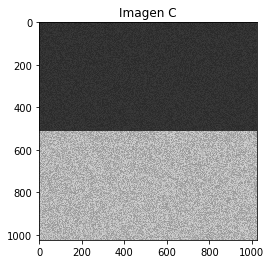

FILTRO GAUSSIANO 3X3



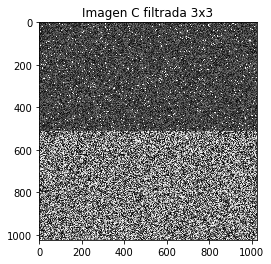


FILTRO GAUSSIANO 5X5



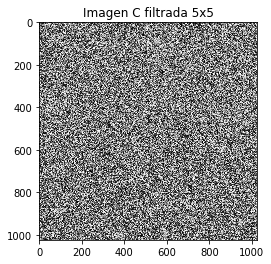


FILTRO GAUSSIANO 11X11



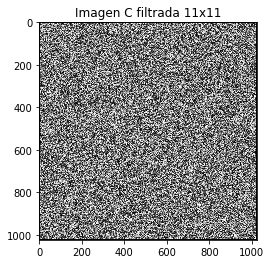

In [52]:
print('FILTROS GAUSSIANO IMAGEN C')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
mascara3x3=np.array ([[1,2,1],[2,4,2],[1,2,1]])
mascara5x5=np.array([[0,1,2,1,0],[1,3,5,3,1],[2,5,9,5,2],[1,3,5,3,1],[0,1,2,1,0]])
mascara11x11=np.array([[0,1,2,3,4,5,4,3,2,1,0],[1,2,3,4,5,10,5,4,3,2,1],[2,3,4,5,10,15,10,5,4,3,2],[3,4,5,10,15,20,15,10,5,4,3],[4,5,10,15,20,25,20,15,10,5,4],[5,10,15,20,25,30,25,20,15,10,5],[4,5,10,15,20,25,20,15,10,5,4],[3,4,5,10,15,20,15,10,5,4,3],[2,3,4,5,10,15,10,5,4,3,2],[1,2,3,4,5,10,5,4,3,2,1],[0,1,2,3,4,5,4,3,2,1,0]])

Cgaussianooriginal= cv2. imread ('C.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Cgaussianooriginal)
plt.title('Imagen C')
plt.show()
Cgaussiano=convertirespaciodecolor(Cgaussianooriginal)
imCgaussiano=Cgaussiano[:,:,0]
nuevaCgaussiano,tama,tamanu=agregarceros(imCgaussiano)

print('FILTRO GAUSSIANO 3X3')
print()
Cgaussianofiltrada3=filtrogaussiano3x3(nuevaCgaussiano,tama,tamanu,Cgaussiano,mascara3x3)
plt.imshow(Cgaussianofiltrada3)
plt.title('Imagen C filtrada 3x3')
plt.show()

print()
print('FILTRO GAUSSIANO 5X5')
print()
Cgaussianofiltrada5=filtrogaussiano5x5(nuevaCgaussiano,tama,tamanu,Cgaussiano,mascara5x5)
plt.imshow(Cgaussianofiltrada5)
plt.title('Imagen C filtrada 5x5')
plt.show()

print()
print('FILTRO GAUSSIANO 11X11')
print()
Cgaussianofiltrada11=filtrogaussiano11x11(nuevaCgaussiano,tama,tamanu,Cgaussiano,mascara11x11)
plt.imshow(Cgaussianofiltrada11)
plt.title('Imagen C filtrada 11x11')
plt.show()

## Imagen D

FILTROS GAUSSIANO IMAGEN D



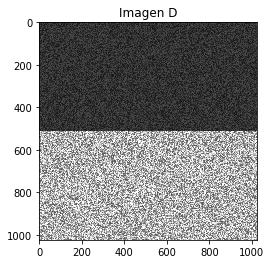

FILTRO GAUSSIANO 3X3



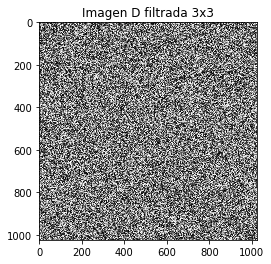


FILTRO GAUSSIANO 5X5



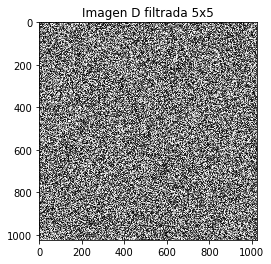


FILTRO GAUSSIANO 11X11



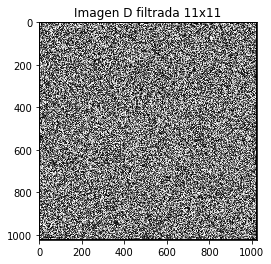

In [53]:
print('FILTROS GAUSSIANO IMAGEN D')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
mascara3x3=np.array ([[1,2,1],[2,4,2],[1,2,1]])
mascara5x5=np.array([[0,1,2,1,0],[1,3,5,3,1],[2,5,9,5,2],[1,3,5,3,1],[0,1,2,1,0]])
mascara11x11=np.array([[0,1,2,3,4,5,4,3,2,1,0],[1,2,3,4,5,10,5,4,3,2,1],[2,3,4,5,10,15,10,5,4,3,2],[3,4,5,10,15,20,15,10,5,4,3],[4,5,10,15,20,25,20,15,10,5,4],[5,10,15,20,25,30,25,20,15,10,5],[4,5,10,15,20,25,20,15,10,5,4],[3,4,5,10,15,20,15,10,5,4,3],[2,3,4,5,10,15,10,5,4,3,2],[1,2,3,4,5,10,5,4,3,2,1],[0,1,2,3,4,5,4,3,2,1,0]])

Dgaussianooriginal= cv2. imread ('D.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Dgaussianooriginal)
plt.title('Imagen D')
plt.show()
Dgaussiano=convertirespaciodecolor(Dgaussianooriginal)
imDgaussiano=Dgaussiano[:,:,0]
nuevaDgaussiano,tama,tamanu=agregarceros(imDgaussiano)

print('FILTRO GAUSSIANO 3X3')
print()
Dgaussianofiltrada3=filtrogaussiano3x3(nuevaDgaussiano,tama,tamanu,Dgaussiano,mascara3x3)
plt.imshow(Dgaussianofiltrada3)
plt.title('Imagen D filtrada 3x3')
plt.show()

print()
print('FILTRO GAUSSIANO 5X5')
print()
Dgaussianofiltrada5=filtrogaussiano5x5(nuevaDgaussiano,tama,tamanu,Dgaussiano,mascara5x5)
plt.imshow(Dgaussianofiltrada5)
plt.title('Imagen D filtrada 5x5')
plt.show()

print()
print('FILTRO GAUSSIANO 11X11')
print()
Dgaussianofiltrada11=filtrogaussiano11x11(nuevaDgaussiano,tama,tamanu,Dgaussiano,mascara11x11)
plt.imshow(Dgaussianofiltrada11)
plt.title('Imagen D filtrada 11x11')
plt.show()

## Imagen E

FILTROS GAUSSIANO IMAGEN E



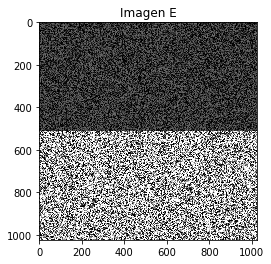

FILTRO GAUSSIANO 3X3



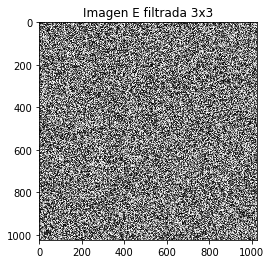


FILTRO GAUSSIANO 5X5



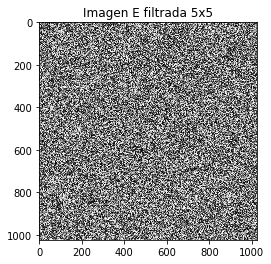


FILTRO GAUSSIANO 11X11



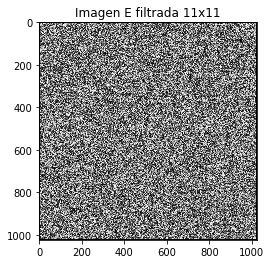

In [54]:
print('FILTROS GAUSSIANO IMAGEN E')
print()
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
mascara3x3=np.array ([[1,2,1],[2,4,2],[1,2,1]])
mascara5x5=np.array([[0,1,2,1,0],[1,3,5,3,1],[2,5,9,5,2],[1,3,5,3,1],[0,1,2,1,0]])
mascara11x11=np.array([[0,1,2,3,4,5,4,3,2,1,0],[1,2,3,4,5,10,5,4,3,2,1],[2,3,4,5,10,15,10,5,4,3,2],[3,4,5,10,15,20,15,10,5,4,3],[4,5,10,15,20,25,20,15,10,5,4],[5,10,15,20,25,30,25,20,15,10,5],[4,5,10,15,20,25,20,15,10,5,4],[3,4,5,10,15,20,15,10,5,4,3],[2,3,4,5,10,15,10,5,4,3,2],[1,2,3,4,5,10,5,4,3,2,1],[0,1,2,3,4,5,4,3,2,1,0]])

Egaussianooriginal= cv2. imread ('E.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Egaussianooriginal)
plt.title('Imagen E')
plt.show()
Egaussiano=convertirespaciodecolor(Egaussianooriginal)
imEgaussiano=Egaussiano[:,:,0]
nuevaEgaussiano,tama,tamanu=agregarceros(imEgaussiano)

print('FILTRO GAUSSIANO 3X3')
print()
Egaussianofiltrada3=filtrogaussiano3x3(nuevaEgaussiano,tama,tamanu,Egaussiano,mascara3x3)
plt.imshow(Egaussianofiltrada3)
plt.title('Imagen E filtrada 3x3')
plt.show()

print()
print('FILTRO GAUSSIANO 5X5')
print()
Egaussianofiltrada5=filtrogaussiano5x5(nuevaEgaussiano,tama,tamanu,Egaussiano,mascara5x5)
plt.imshow(Egaussianofiltrada5)
plt.title('Imagen E filtrada 5x5')
plt.show()

print()
print('FILTRO GAUSSIANO 11X11')
print()
Egaussianofiltrada11=filtrogaussiano11x11(nuevaEgaussiano,tama,tamanu,Egaussiano,mascara11x11)
plt.imshow(Egaussianofiltrada11)
plt.title('Imagen E filtrada 11x11')
plt.show()

## Evaluación de desempeño

### SNR

In [111]:
import cv2
import numpy as np
import math
from matplotlib import pyplot as plt
# imf filtrada ima iamgen original  im imagen A
A= cv2. imread ('A.tif')

print('Imagen B,C,D,E')

SNRmediaB3=SNR(Bfiltradamedia3,Bmediaoriginal,A)
SNRmediaC3=SNR(Cfiltradamedia3,Cmediaoriginal,A)
SNRmediaD3=SNR(Dfiltradamedia3,Dmediaoriginal,A)
SNRmediaE3=SNR(Efiltradamedia3,Emediaoriginal,A)

###############################################################

SNRmediaB5=SNR(Bfiltradamedia5,Bmediaoriginal,A)
SNRmediaC5=SNR(Cfiltradamedia5,Cmediaoriginal,A)
SNRmediaD5=SNR(Dfiltradamedia5,Dmediaoriginal,A)
SNRmediaE5=SNR(Efiltradamedia5,Emediaoriginal,A)

############################################
SNRmediaB11=SNR(Bfiltradamedia11,Bmediaoriginal,A)
SNRmediaC11=SNR(Cfiltradamedia11,Cmediaoriginal,A)
SNRmediaD11=SNR(Dfiltradamedia11,Dmediaoriginal,A)
SNRmediaE11=SNR(Efiltradamedia11,Emediaoriginal,A)

############################################

#EPImediaB=EPI(Bfiltradamedia3,A)
print('FILTRO DE MEDIA')
print()
print('FILTRO 3X3')
print()
print(SNRmediaB3)
print()
print(SNRmediaC3)
print()
print(SNRmediaD3)
print()
print(SNRmediaE3)
print()
print('FILTRO 5X5')
print()
print(SNRmediaB5)
print()
print(SNRmediaC5)
print()
print(SNRmediaD5)
print()
print(SNRmediaE5)
print()
print('FILTRO 11X11')
print()
print(SNRmediaB11)
print()
print(SNRmediaC11)
print()
print(SNRmediaD11)
print()
print(SNRmediaE11)
print()

############################################
SNRmaxB3=SNR(Bmaxfiltrada3,Bmaxoriginal,A)
SNRmaxC3=SNR(Cmaxfiltrada3,Cmaxoriginal,A)
SNRmaxD3=SNR(Dmaxfiltrada3,Dmaxoriginal,A)
SNRmaxE3=SNR(Emaxfiltrada3,Emaxoriginal,A)

###############################################################

SNRmaxB5=SNR(Bmaxfiltrada5,Bmaxoriginal,A)
SNRmaxC5=SNR(Cmaxfiltrada5,Cmaxoriginal,A)
SNRmaxD5=SNR(Dmaxfiltrada5,Dmaxoriginal,A)
SNRmaxE5=SNR(Emaxfiltrada5,Emaxoriginal,A)

############################################
SNRmaxB11=SNR(Bmaxfiltrada11,Bmaxoriginal,A)
SNRmaxC11=SNR(Cmaxfiltrada11,Cmaxoriginal,A)
SNRmaxD11=SNR(Dmaxfiltrada11,Dmaxoriginal,A)
SNRmaxE11=SNR(Emaxfiltrada11,Emaxoriginal,A)
############################################

print('FILTRO MAXIMO')
print()
print('FILTRO 3X3')
print()
print(SNRmaxB3)
print()
print(SNRmaxC3)
print()
print(SNRmaxD3)
print()
print(SNRmaxE3)
print()
print('FILTRO 5X5')
print()
print(SNRmaxB5)
print()
print(SNRmaxC5)
print()
print(SNRmaxD5)
print()
print(SNRmaxE5)
print()
print('FILTRO 11X11')
print()
print(SNRmaxB11)
print()
print(SNRmaxC11)
print()
print(SNRmaxD11)
print()
print(SNRmaxE11)
print()

############################################
SNRminB3=SNR(Bminfiltrada3,Bminoriginal,A)
SNRminC3=SNR(Cminfiltrada3,Cminoriginal,A)
SNRminD3=SNR(Dminfiltrada3,Dminoriginal,A)
SNRminE3=SNR(Eminfiltrada3,Eminoriginal,A)

###############################################################

SNRminB5=SNR(Bminfiltrada5,Bminoriginal,A)
SNRminC5=SNR(Cminfiltrada5,Cminoriginal,A)
SNRminD5=SNR(Dminfiltrada5,Dminoriginal,A)
SNRminE5=SNR(Eminfiltrada5,Eminoriginal,A)

############################################
SNRminB11=SNR(Bminfiltrada11,Bminoriginal,A)
SNRminC11=SNR(Cminfiltrada11,Cminoriginal,A)
SNRminD11=SNR(Dminfiltrada11,Dminoriginal,A)
SNRminE11=SNR(Eminfiltrada11,Eminoriginal,A)
############################################

print('FILTRO MINIMO')
print()
print('FILTRO 3X3')
print()
print(SNRminB3)
print()
print(SNRminC3)
print()
print(SNRminD3)
print()
print(SNRminE3)
print()
print('FILTRO 5X5')
print()
print(SNRminB5)
print()
print(SNRminC5)
print()
print(SNRminD5)
print()
print(SNRminE5)
print()
print('FILTRO 11X11')
print()
print(SNRminB11)
print()
print(SNRminC11)
print()
print(SNRminD11)
print()
print(SNRminE11)
print()

############################################
SNRmedianaB3=SNR(Bmedianafiltrada3,Bmedianaoriginal,A)
SNRmedianaC3=SNR(Cmedianafiltrada3,Cmedianaoriginal,A)
SNRmedianaD3=SNR(Dmedianafiltrada3,Dmedianaoriginal,A)
SNRmedianaE3=SNR(Emedianafiltrada3,Emedianaoriginal,A)

###############################################################
SNRmedianaB5=SNR(Bmedianafiltrada5,Bmedianaoriginal,A)
SNRmedianaC5=SNR(Cmedianafiltrada5,Cmedianaoriginal,A)
SNRmedianaD5=SNR(Dmedianafiltrada5,Dmedianaoriginal,A)
SNRmedianaE5=SNR(Emedianafiltrada5,Emedianaoriginal,A)

############################################
SNRmedianaB11=SNR(Bmedianafiltrada11,Bmedianaoriginal,A)
SNRmedianaC11=SNR(Cmedianafiltrada11,Cmedianaoriginal,A)
SNRmedianaD11=SNR(Dmedianafiltrada11,Dmedianaoriginal,A)
SNRmedianaE11=SNR(Emedianafiltrada11,Emedianaoriginal,A)
############################################

print('FILTRO MEDIANA')
print()
print('FILTRO 3X3')
print()
print(SNRmedianaB3)
print()
print(SNRmedianaC3)
print()
print(SNRmedianaD3)
print()
print(SNRmedianaE3)
print()
print('FILTRO 5X5')
print()
print(SNRmedianaB5)
print()
print(SNRmedianaC5)
print()
print(SNRmedianaD5)
print()
print(SNRmedianaE5)
print()
print('FILTRO 11X11')
print()
print(SNRmedianaB11)
print()
print(SNRmedianaC11)
print()
print(SNRmedianaD11)
print()
print(SNRmedianaE11)
print()
############################################
SNRmedianaponderadaB3=SNR(Bmedianaponderadafiltrada3,Bmedianaponderadaoriginal,A)
SNRmedianaponderadaC3=SNR(Cmedianaponderadafiltrada3,Cmedianaponderadaoriginal,A)
SNRmedianaponderadaD3=SNR(Dmedianaponderadafiltrada3,Dmedianaponderadaoriginal,A)
SNRmedianaponderadaE3=SNR(Emedianaponderadafiltrada3,Emedianaponderadaoriginal,A)

###############################################################
SNRmedianaponderadaB5=SNR(Bmedianaponderadafiltrada5,Bmedianaponderadaoriginal,A)
SNRmedianaponderadaC5=SNR(Cmedianaponderadafiltrada5,Cmedianaponderadaoriginal,A)
SNRmedianaponderadaD5=SNR(Dmedianaponderadafiltrada5,Dmedianaponderadaoriginal,A)
SNRmedianaponderadaE5=SNR(Emedianaponderadafiltrada5,Emedianaponderadaoriginal,A)

############################################
SNRmedianaponderadaB11=SNR(Bmedianaponderadafiltrada11,Bmedianaponderadaoriginal,A)
SNRmedianaponderadaC11=SNR(Cmedianaponderadafiltrada11,Cmedianaponderadaoriginal,A)
SNRmedianaponderadaD11=SNR(Dmedianaponderadafiltrada11,Dmedianaponderadaoriginal,A)
SNRmedianaponderadaE11=SNR(Emedianaponderadafiltrada11,Emedianaponderadaoriginal,A)
############################################

print('FILTRO MEDIANA PONDERADA')
print()
print('FILTRO 3X3')
print()
print(SNRmedianaponderadaB3)
print()
print(SNRmedianaponderadaC3)
print()
print(SNRmedianaponderadaD3)
print()
print(SNRmedianaponderadaE3)
print()
print('FILTRO 5X5')
print()
print(SNRmedianaponderadaB5)
print()
print(SNRmedianaponderadaC5)
print()
print(SNRmedianaponderadaD5)
print()
print(SNRmedianaponderadaE5)
print()
print('FILTRO 11X11')
print()
print(SNRmedianaponderadaB11)
print()
print(SNRmedianaponderadaC11)
print()
print(SNRmedianaponderadaD11)
print()
print(SNRmedianaponderadaE11)
print()

############################################
SNRgaussianoB3=SNR(Bgaussianofiltrada3,Bgaussianooriginal,A)
SNRgaussianoC3=SNR(Cgaussianofiltrada3,Cgaussianooriginal,A)
SNRgaussianoD3=SNR(Dgaussianofiltrada3,Dgaussianooriginal,A)
SNRgaussianoE3=SNR(Egaussianofiltrada3,Egaussianooriginal,A)
###############################################################
SNRgaussianoB5=SNR(Bgaussianofiltrada5,Bgaussianooriginal,A)
SNRgaussianoC5=SNR(Cgaussianofiltrada5,Cgaussianooriginal,A)
SNRgaussianoD5=SNR(Dgaussianofiltrada5,Dgaussianooriginal,A)
SNRgaussianoE5=SNR(Egaussianofiltrada5,Egaussianooriginal,A)
############################################
SNRgaussianoB11=SNR(Bgaussianofiltrada11,Bgaussianooriginal,A)
SNRgaussianoC11=SNR(Cgaussianofiltrada11,Cgaussianooriginal,A)
SNRgaussianoD11=SNR(Dgaussianofiltrada11,Dgaussianooriginal,A)
SNRgaussianoE11=SNR(Egaussianofiltrada11,Egaussianooriginal,A)
############################################

print('GAUSSIANO')
print()
print('FILTRO 3X3')
print()
print(SNRgaussianoB3)
print()
print(SNRgaussianoC3)
print()
print(SNRgaussianoD3)
print()
print(SNRgaussianoE3)
print()
print('FILTRO 5X5')
print()
print(SNRgaussianoB5)
print()
print(SNRgaussianoC5)
print()
print(SNRgaussianoD5)
print()
print(SNRgaussianoE5)
print()
print('FILTRO 11X11')
print()
print(SNRgaussianoB11)
print()
print(SNRgaussianoC11)
print()
print(SNRgaussianoD11)
print()
print(SNRgaussianoE11)
print()

Imagen B,C,D,E


C:\Users\Nataly\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: overflow encountered in ubyte_scalars
  if sys.path[0] == '':


FILTRO DE MEDIA

FILTRO 3X3

24.1

18.74

16.38

16.03

FILTRO 5X5

23.67

18.58

16.3

16.0

FILTRO 11X11

23.19

18.45

16.18

15.96

FILTRO MAXIMO

FILTRO 3X3

20.45

17.25

16.69

17.24

FILTRO 5X5

19.91

16.83

16.38

17.03

FILTRO 11X11

19.64

16.7

16.27

17.05

FILTRO MINIMO

FILTRO 3X3

20.79

17.26

16.59

17.04

FILTRO 5X5

20.4

16.83

16.16

17.13

FILTRO 11X11

20.18

16.71

15.95

17.18

FILTRO MEDIANA

FILTRO 3X3

23.96

19.09

16.93

16.77

FILTRO 5X5

23.72

18.72

16.49

16.23

FILTRO 11X11

23.43

18.52

16.31

15.96

FILTRO MEDIANA PONDERADA

FILTRO 3X3

26.05

20.57

18.15

18.06

FILTRO 5X5

25.12

19.69

17.28

17.11

FILTRO 11X11

23.67

18.69

16.45

16.1

FILTRO MEDIANA PONDERADA

FILTRO 3X3

16.11

16.17

16.04

16.02

FILTRO 5X5

16.23

16.04

16.03

16.02

FILTRO 11X11

16.06

16.04

16.04

16.03



## EPI

In [112]:
#calcular EPI
#def EPI(imf,im1)

import cv2
import numpy as np
import math
from matplotlib import pyplot as plt
# imf filtrada ima iamgen original  im imagen A
A= cv2. imread ('A.tif')

print('Imagen B,C,D,E')

EPImediaB3=EPI(Bfiltradamedia3,A)
EPImediaC3=EPI(Cfiltradamedia3,A)
EPImediaD3=EPI(Dfiltradamedia3,A)
EPImediaE3=EPI(Efiltradamedia3,A)

###############################################################

EPImediaB5=EPI(Bfiltradamedia5,A)
EPImediaC5=EPI(Cfiltradamedia5,A)
EPImediaD5=EPI(Dfiltradamedia5,A)
EPImediaE5=EPI(Efiltradamedia5,A)

############################################
EPImediaB11=EPI(Bfiltradamedia11,A)
EPImediaC11=EPI(Cfiltradamedia11,A)
EPImediaD11=EPI(Dfiltradamedia11,A)
EPImediaE11=EPI(Efiltradamedia11,A)
############################################

#EPImediaB=EPI(Bfiltradamedia3,A)
print('FILTRO DE MEDIA')
print()
print('FILTRO 3X3')
print()
print(EPImediaB3)
print()
print(EPImediaC3)
print()
print(EPImediaD3)
print()
print(EPImediaE3)
print()
print('FILTRO 5X5')
print()
print(EPImediaB5)
print()
print(EPImediaC5)
print()
print(EPImediaD5)
print()
print(EPImediaE5)
print()
print('FILTRO 11X11')
print()
print(EPImediaB11)
print()
print(EPImediaC11)
print()
print(EPImediaD11)
print()
print(EPImediaE11)
print()

############################################
EPImaxB3=EPI(Bmaxfiltrada3,A)
EPImaxC3=EPI(Cmaxfiltrada3,A)
EPImaxD3=EPI(Dmaxfiltrada3,A)
EPImaxE3=EPI(Emaxfiltrada3,A)

###############################################################
EPImaxB5=EPI(Bmaxfiltrada5,A)
EPImaxC5=EPI(Cmaxfiltrada5,A)
EPImaxD5=EPI(Dmaxfiltrada5,A)
EPImaxE5=EPI(Emaxfiltrada5,A)

############################################
EPImaxB11=EPI(Bmaxfiltrada11,A)
EPImaxC11=EPI(Cmaxfiltrada11,A)
EPImaxD11=EPI(Dmaxfiltrada11,A)
EPImaxE11=EPI(Emaxfiltrada11,A)
############################################

print('FILTRO MAXIMO')
print()
print('FILTRO 3X3')
print()
print(EPImaxB3)
print()
print(EPImaxC3)
print()
print(EPImaxD3)
print()
print(EPImaxE3)
print()
print('FILTRO 5X5')
print()
print(EPImaxB5)
print()
print(EPImaxC5)
print()
print(EPImaxD5)
print()
print(EPImaxE5)
print()
print('FILTRO 11X11')
print()
print(EPImaxB11)
print()
print(EPImaxC11)
print()
print(EPImaxD11)
print()
print(EPImaxE11)
print()

############################################
EPIminB3=EPI(Bminfiltrada3,A)
EPIminC3=EPI(Cminfiltrada3,A)
EPIminD3=EPI(Dminfiltrada3,A)
EPIminE3=EPI(Eminfiltrada3,A)

###############################################################

EPIminB5=EPI(Bminfiltrada5,A)
EPIminC5=EPI(Cminfiltrada5,A)
EPIminD5=EPI(Dminfiltrada5,A)
EPIminE5=EPI(Eminfiltrada5,A)

############################################
EPIminB11=EPI(Bminfiltrada11,A)
EPIminC11=EPI(Cminfiltrada11,A)
EPIminD11=EPI(Dminfiltrada11,A)
EPIminE11=EPI(Eminfiltrada11,A)
############################################

print('FILTRO MINIMO')
print()
print('FILTRO 3X3')
print()
print(EPIminB3)
print()
print(EPIminC3)
print()
print(EPIminD3)
print()
print(EPIminE3)
print()
print('FILTRO 5X5')
print()
print(EPIminB5)
print()
print(EPIminC5)
print()
print(EPIminD5)
print()
print(EPIminE5)
print()
print('FILTRO 11X11')
print()
print(EPIminB11)
print()
print(EPIminC11)
print()
print(EPIminD11)
print()
print(EPIminE11)
print()

############################################
EPImedianaB3=EPI(Bmedianafiltrada3,A)
EPImedianaC3=EPI(Cmedianafiltrada3,A)
EPImedianaD3=EPI(Dmedianafiltrada3,A)
EPImedianaE3=EPI(Emedianafiltrada3,A)

###############################################################
EPImedianaB5=EPI(Bmedianafiltrada5,A)
EPImedianaC5=EPI(Cmedianafiltrada5,A)
EPImedianaD5=EPI(Dmedianafiltrada5,A)
EPImedianaE5=EPI(Emedianafiltrada5,A)
############################################
EPImedianaB11=EPI(Bmedianafiltrada11,A)
EPImedianaC11=EPI(Cmedianafiltrada11,A)
EPImedianaD11=EPI(Dmedianafiltrada11,A)
EPImedianaE11=EPI(Emedianafiltrada11,A)
############################################

print('FILTRO MEDIANA')
print()
print('FILTRO 3X3')
print()
print(EPImedianaB3)
print()
print(EPImedianaC3)
print()
print(EPImedianaD3)
print()
print(EPImedianaE3)
print()
print('FILTRO 5X5')
print()
print(EPImedianaB5)
print()
print(EPImedianaC5)
print()
print(EPImedianaD5)
print()
print(EPImedianaE5)
print()
print('FILTRO 11X11')
print()
print(EPImedianaB11)
print()
print(EPImedianaC11)
print()
print(EPImedianaD11)
print()
print(EPImedianaE11)
print()
############################################
EPImedianaponderadaB3=EPI(Bmedianaponderadafiltrada3,A)
EPImedianaponderadaC3=EPI(Cmedianaponderadafiltrada3,A)
EPImedianaponderadaD3=EPI(Dmedianaponderadafiltrada3,A)
EPImedianaponderadaE3=EPI(Emedianaponderadafiltrada3,A)

###############################################################
EPImedianaponderadaB5=EPI(Bmedianaponderadafiltrada5,A)
EPImedianaponderadaC5=EPI(Cmedianaponderadafiltrada5,A)
EPImedianaponderadaD5=EPI(Dmedianaponderadafiltrada5,A)
EPImedianaponderadaE5=EPI(Emedianaponderadafiltrada5,A)
############################################
EPImedianaponderadaB11=EPI(Bmedianaponderadafiltrada11,A)
EPImedianaponderadaC11=EPI(Cmedianaponderadafiltrada11,A)
EPImedianaponderadaD11=EPI(Dmedianaponderadafiltrada11,A)
EPImedianaponderadaE11=EPI(Emedianaponderadafiltrada11,A)

############################################

print('FILTRO MEDIANA PONDERADA')
print()
print('FILTRO 3X3')
print()
print(EPImedianaponderadaB3)
print()
print(EPImedianaponderadaC3)
print()
print(EPImedianaponderadaD3)
print()
print(EPImedianaponderadaE3)
print()
print('FILTRO 5X5')
print()
print(EPImedianaponderadaB5)
print()
print(EPImedianaponderadaC5)
print()
print(EPImedianaponderadaD5)
print()
print(EPImedianaponderadaE5)
print()
print('FILTRO 11X11')
print()
print(EPImedianaponderadaB11)
print()
print(EPImedianaponderadaC11)
print()
print(EPImedianaponderadaD11)
print()
print(EPImedianaponderadaE11)
print()

############################################
EPIgaussianoB3=EPI(Bgaussianofiltrada3,A)
EPIgaussianoC3=EPI(Cgaussianofiltrada3,A)
EPIgaussianoD3=EPI(Dgaussianofiltrada3,A)
EPIgaussianoE3=EPI(Egaussianofiltrada3,A)
###############################################################
EPIgaussianoB5=EPI(Bgaussianofiltrada5,A)
EPIgaussianoC5=EPI(Cgaussianofiltrada5,A)
EPIgaussianoD5=EPI(Dgaussianofiltrada5,A)
EPIgaussianoE5=EPI(Egaussianofiltrada5,A)
############################################
EPIgaussianoB11=EPI(Bgaussianofiltrada11,A)
EPIgaussianoC11=EPI(Cgaussianofiltrada11,A)
EPIgaussianoD11=EPI(Dgaussianofiltrada11,A)
EPIgaussianoE11=EPI(Egaussianofiltrada11,A)
############################################

print('FILTRO GAUSSIANO')
print()
print('FILTRO 3X3')
print()
print(EPIgaussianoB3)
print()
print(EPIgaussianoC3)
print()
print(EPIgaussianoD3)
print()
print(EPIgaussianoE3)
print()
print('FILTRO 5X5')
print()
print(EPIgaussianoB5)
print()
print(EPIgaussianoC5)
print()
print(EPIgaussianoD5)
print()
print(EPIgaussianoE5)
print()
print('FILTRO 11X11')
print()
print(EPIgaussianoB11)
print()
print(EPIgaussianoC11)
print()
print(EPIgaussianoD11)
print()
print(EPIgaussianoE11)
print()

Imagen B,C,D,E
FILTRO DE MEDIA

FILTRO 3X3

0.9920980491740763

0.9921142511194581

0.9921338725640174

0.9921438211031022

FILTRO 5X5

0.992035010054822

0.9921138117150827

0.9921296966126045

0.9921407319341112

FILTRO 11X11

0.9917187077773212

0.9920417737030118

0.9920417737030118

0.9921289237933991

FILTRO MAXIMO

FILTRO 3X3

0.9921054979099879

0.992116810966102

0.9921356866205756

0.9921257979564565

FILTRO 5X5

0.9918669290197443

0.9920936850798143

0.9920900324712141

0.9920697343897671

FILTRO 11X11

0.9906541721834472

0.9914662131191966

0.9914214550503753

0.991721688608105

FILTRO MINIMO

FILTRO 3X3

0.9920460535819495

0.9920949120826226

0.9921175983851025

0.9921238304205335

FILTRO 5X5

0.991859508520348

0.9920496826478024

0.992101005415387

0.9919395867031714

FILTRO 11X11

0.9906607664706865

0.9914238561130971

0.9919209893504513

0.30533032466900684

FILTRO MEDIANA

FILTRO 3X3

0.9924599084360887

0.9922456432978561

0.9921582459068586

0.9921468652715859



### COC

In [127]:
#calcuar CoC
#def COC(imf,im)

import cv2
import numpy as np
import math
from matplotlib import pyplot as plt
# imf filtrada ima iamgen original  im imagen A
A= cv2. imread ('A.tif')

print('Imagen B,C,D,E')

COCmediaB3=COC(Bfiltradamedia3,A)
COCmediaC3=COC(Cfiltradamedia3,A)
COCmediaD3=COC(Dfiltradamedia3,A)
COCmediaE3=COC(Efiltradamedia3,A)

###############################################################

COCmediaB5=COC(Bfiltradamedia5,A)
COCmediaC5=COC(Cfiltradamedia5,A)
COCmediaD5=COC(Dfiltradamedia5,A)
COCmediaE5=COC(Efiltradamedia5,A)

############################################
COCmediaB11=COC(Bfiltradamedia11,A)
COCmediaC11=COC(Cfiltradamedia11,A)
COCmediaD11=COC(Dfiltradamedia11,A)
COCmediaE11=COC(Efiltradamedia11,A)
############################################

#EPImediaB=EPI(Bfiltradamedia3,A)
print('FILTRO DE MEDIA')
print()
print('FILTRO 3X3')
print()
print(COCmediaB3)
print()
print(COCmediaC3)
print()
print(COCmediaD3)
print()
print(COCmediaE3)
print()
print('FILTRO 5X5')
print()
print(COCmediaB5)
print()
print(COCmediaC5)
print()
print(COCmediaD5)
print()
print(COCmediaE5)
print()
print('FILTRO 11X11')
print()
print(COCmediaB11)
print()
print(COCmediaC11)
print()
print(COCmediaD11)
print()
print(COCmediaE11)
print()

############################################
EPImaxB3=COC(Bmaxfiltrada3,A)
EPImaxC3=COC(Cmaxfiltrada3,A)
EPImaxD3=COC(Dmaxfiltrada3,A)
EPImaxE3=COC(Emaxfiltrada3,A)

###############################################################
EPImaxB5=COC(Bmaxfiltrada5,A)
EPImaxC5=COC(Cmaxfiltrada5,A)
EPImaxD5=COC(Dmaxfiltrada5,A)
EPImaxE5=COC(Emaxfiltrada5,A)

############################################
EPImaxB11=COC(Bmaxfiltrada11,A)
EPImaxC11=COC(Cmaxfiltrada11,A)
EPImaxD11=COC(Dmaxfiltrada11,A)
EPImaxE11=COC(Emaxfiltrada11,A)
############################################

print('FILTRO MAXIMO')
print()
print('FILTRO 3X3')
print()
print(EPImaxB3)
print()
print(EPImaxC3)
print()
print(EPImaxD3)
print()
print(EPImaxE3)
print()
print('FILTRO 5X5')
print()
print(EPImaxB5)
print()
print(EPImaxC5)
print()
print(EPImaxD5)
print()
print(EPImaxE5)
print()
print('FILTRO 11X11')
print()
print(EPImaxB11)
print()
print(EPImaxC11)
print()
print(EPImaxD11)
print()
print(EPImaxE11)
print()

############################################
EPIminB3=COC(Bminfiltrada3,A)
EPIminC3=COC(Cminfiltrada3,A)
EPIminD3=COC(Dminfiltrada3,A)
EPIminE3=COC(Eminfiltrada3,A)

###############################################################

EPIminB5=COC(Bminfiltrada5,A)
EPIminC5=COC(Cminfiltrada5,A)
EPIminD5=COC(Dminfiltrada5,A)
EPIminE5=COC(Eminfiltrada5,A)

############################################
EPIminB11=COC(Bminfiltrada11,A)
EPIminC11=COC(Cminfiltrada11,A)
EPIminD11=COC(Dminfiltrada11,A)
EPIminE11=COC(Eminfiltrada11,A)
############################################

print('FILTRO MINIMO')
print()
print('FILTRO 3X3')
print()
print(EPIminB3)
print()
print(EPIminC3)
print()
print(EPIminD3)
print()
print(EPIminE3)
print()
print('FILTRO 5X5')
print()
print(EPIminB5)
print()
print(EPIminC5)
print()
print(EPIminD5)
print()
print(EPIminE5)
print()
print('FILTRO 11X11')
print()
print(EPIminB11)
print()
print(EPIminC11)
print()
print(EPIminD11)
print()
print(EPIminE11)
print()

############################################
EPImedianaB3=COC(Bmedianafiltrada3,A)
EPImedianaC3=COC(Cmedianafiltrada3,A)
EPImedianaD3=COC(Dmedianafiltrada3,A)
EPImedianaE3=COC(Emedianafiltrada3,A)

###############################################################
EPImedianaB5=COC(Bmedianafiltrada5,A)
EPImedianaC5=COC(Cmedianafiltrada5,A)
EPImedianaD5=COC(Dmedianafiltrada5,A)
EPImedianaE5=COC(Emedianafiltrada5,A)
############################################
EPImedianaB11=COC(Bmedianafiltrada11,A)
EPImedianaC11=COC(Cmedianafiltrada11,A)
EPImedianaD11=COC(Dmedianafiltrada11,A)
EPImedianaE11=COC(Emedianafiltrada11,A)
############################################

print('FILTRO MEDIANA')
print()
print('FILTRO 3X3')
print()
print(EPImedianaB3)
print()
print(EPImedianaC3)
print()
print(EPImedianaD3)
print()
print(EPImedianaE3)
print()
print('FILTRO 5X5')
print()
print(EPImedianaB5)
print()
print(EPImedianaC5)
print()
print(EPImedianaD5)
print()
print(EPImedianaE5)
print()
print('FILTRO 11X11')
print()
print(EPImedianaB11)
print()
print(EPImedianaC11)
print()
print(EPImedianaD11)
print()
print(EPImedianaE11)
print()
############################################
EPImedianaponderadaB3=COC(Bmedianaponderadafiltrada3,A)
EPImedianaponderadaC3=COC(Cmedianaponderadafiltrada3,A)
EPImedianaponderadaD3=COC(Dmedianaponderadafiltrada3,A)
EPImedianaponderadaE3=COC(Emedianaponderadafiltrada3,A)

###############################################################
EPImedianaponderadaB5=COC(Bmedianaponderadafiltrada5,A)
EPImedianaponderadaC5=COC(Cmedianaponderadafiltrada5,A)
EPImedianaponderadaD5=COC(Dmedianaponderadafiltrada5,A)
EPImedianaponderadaE5=COC(Emedianaponderadafiltrada5,A)
############################################
EPImedianaponderadaB11=COC(Bmedianaponderadafiltrada11,A)
EPImedianaponderadaC11=COC(Cmedianaponderadafiltrada11,A)
EPImedianaponderadaD11=COC(Dmedianaponderadafiltrada11,A)
EPImedianaponderadaE11=COC(Emedianaponderadafiltrada11,A)

############################################

print('FILTRO MEDIANA PONDERADA')
print()
print('FILTRO 3X3')
print()
print(EPImedianaponderadaB3)
print()
print(EPImedianaponderadaC3)
print()
print(EPImedianaponderadaD3)
print()
print(EPImedianaponderadaE3)
print()
print('FILTRO 5X5')
print()
print(EPImedianaponderadaB5)
print()
print(EPImedianaponderadaC5)
print()
print(EPImedianaponderadaD5)
print()
print(EPImedianaponderadaE5)
print()
print('FILTRO 11X11')
print()
print(EPImedianaponderadaB11)
print()
print(EPImedianaponderadaC11)
print()
print(EPImedianaponderadaD11)
print()
print(EPImedianaponderadaE11)
print()

############################################
EPIgaussianoB3=COC(Bgaussianofiltrada3,A)
EPIgaussianoC3=COC(Cgaussianofiltrada3,A)
EPIgaussianoD3=COC(Dgaussianofiltrada3,A)
EPIgaussianoE3=COC(Egaussianofiltrada3,A)
#############################################################
EPIgaussianoB5=COC(Bgaussianofiltrada5,A)
EPIgaussianoC5=COC(Cgaussianofiltrada5,A)
EPIgaussianoD5=COC(Dgaussianofiltrada5,A)
EPIgaussianoE5=COC(Egaussianofiltrada5,A)
############################################
EPIgaussianoB11=COC(Bgaussianofiltrada11,A)
EPIgaussianoC11=COC(Cgaussianofiltrada11,A)
EPIgaussianoD11=COC(Dgaussianofiltrada11,A)
EPIgaussianoE11=COC(Egaussianofiltrada11,A)
############################################

print('FILTRO GAUSSIANO')
print()
print('FILTRO 3X3')
print()
print(EPIgaussianoB3)
print()
print(EPIgaussianoC3)
print()
print(EPIgaussianoD3)
print()
print(EPIgaussianoE3)
print()
print('FILTRO 5X5')
print()
print(EPIgaussianoB5)
print()
print(EPIgaussianoC5)
print()
print(EPIgaussianoD5)
print()
print(EPIgaussianoE5)
print()
print('FILTRO 11X11')
print()
print(EPIgaussianoB11)
print()
print(EPIgaussianoC11)
print()
print(EPIgaussianoD11)
print()
print(EPIgaussianoE11)
print()

Imagen B,C,D,E
FILTRO DE MEDIA

FILTRO 3X3

0.9999999841837507

0.9999999816690284

0.9999973253668419

0.9999996681051263

FILTRO 5X5

0.999999953051803

0.9999999520350886

0.9999999447966192

0.9999998979959779

FILTRO 11X11

0.9999998384993534

0.9999998379554069

0.9999998379554069

0.9999998357197258

FILTRO MAXIMO

FILTRO 3X3

0.9999999803471475

0.9999999603272446

0.999999773878864

0.9999991553028733

FILTRO 5X5

0.9999999381941316

0.9999999150219542

0.9999997030894128

0.9999990200980018

FILTRO 11X11

0.9999998127400171

0.9999997916016446

0.9999995692018226

0.9999988353938796

FILTRO MINIMO

FILTRO 3X3

0.9999999413118463

0.9999999099417477

0.9999994068968265

0.9999643741086965

FILTRO 5X5

0.9999998976795689

0.9999998565969362

0.9999996222440289

0.9997499965132042

FILTRO 11X11

0.9999997660047427

0.9999997118148494

0.9999995873233024

0.0347738638340347

FILTRO MEDIANA

FILTRO 3X3

0.9999999988681413

0.9999999917819804

0.9999998585781369

0.9999987499945583

### QI

In [55]:
#calcular QI
#def QI(imf,im):

import cv2
import numpy as np
import math
from matplotlib import pyplot as plt
# imf filtrada ima iamgen original  im imagen A
A= cv2. imread ('A.tif')

print('Imagen B,C,D,E')

COCmediaB3=QI(Bfiltradamedia3,A)
COCmediaC3=QI(Cfiltradamedia3,A)
COCmediaD3=QI(Dfiltradamedia3,A)
COCmediaE3=QI(Efiltradamedia3,A)

###############################################################

COCmediaB5=QI(Bfiltradamedia5,A)
COCmediaC5=QI(Cfiltradamedia5,A)
COCmediaD5=QI(Dfiltradamedia5,A)
COCmediaE5=QI(Efiltradamedia5,A)

############################################
COCmediaB11=QI(Bfiltradamedia11,A)
COCmediaC11=QI(Cfiltradamedia11,A)
COCmediaD11=QI(Dfiltradamedia11,A)
COCmediaE11=QI(Efiltradamedia11,A)
############################################

#EPImediaB=EPI(Bfiltradamedia3,A)
print('FILTRO DE MEDIA')
print()
print('FILTRO 3X3')
print()
print(COCmediaB3)
print()
print(COCmediaC3)
print()
print(COCmediaD3)
print()
print(COCmediaE3)
print()
print('FILTRO 5X5')
print()
print(COCmediaB5)
print()
print(COCmediaC5)
print()
print(COCmediaD5)
print()
print(COCmediaE5)
print()
print('FILTRO 11X11')
print()
print(COCmediaB11)
print()
print(COCmediaC11)
print()
print(COCmediaD11)
print()
print(COCmediaE11)
print()

############################################
EPImaxB3=QI(Bmaxfiltrada3,A)
EPImaxC3=QI(Cmaxfiltrada3,A)
EPImaxD3=QI(Dmaxfiltrada3,A)
EPImaxE3=QI(Emaxfiltrada3,A)

###############################################################
EPImaxB5=QI(Bmaxfiltrada5,A)
EPImaxC5=QI(Cmaxfiltrada5,A)
EPImaxD5=QI(Dmaxfiltrada5,A)
EPImaxE5=QI(Emaxfiltrada5,A)

############################################
EPImaxB11=QI(Bmaxfiltrada11,A)
EPImaxC11=QI(Cmaxfiltrada11,A)
EPImaxD11=QI(Dmaxfiltrada11,A)
EPImaxE11=QI(Emaxfiltrada11,A)
############################################

print('FILTRO MAXIMO')
print()
print('FILTRO 3X3')
print()
print(EPImaxB3)
print()
print(EPImaxC3)
print()
print(EPImaxD3)
print()
print(EPImaxE3)
print()
print('FILTRO 5X5')
print()
print(EPImaxB5)
print()
print(EPImaxC5)
print()
print(EPImaxD5)
print()
print(EPImaxE5)
print()
print('FILTRO 11X11')
print()
print(EPImaxB11)
print()
print(EPImaxC11)
print()
print(EPImaxD11)
print()
print(EPImaxE11)
print()



############################################
EPImedianaB3=QI(Bmedianafiltrada3,A)
EPImedianaC3=QI(Cmedianafiltrada3,A)
EPImedianaD3=QI(Dmedianafiltrada3,A)
EPImedianaE3=QI(Emedianafiltrada3,A)

###############################################################
EPImedianaB5=QI(Bmedianafiltrada5,A)
EPImedianaC5=QI(Cmedianafiltrada5,A)
EPImedianaD5=QI(Dmedianafiltrada5,A)
EPImedianaE5=QI(Emedianafiltrada5,A)
############################################
EPImedianaB11=QI(Bmedianafiltrada11,A)
EPImedianaC11=QI(Cmedianafiltrada11,A)
EPImedianaD11=QI(Dmedianafiltrada11,A)
EPImedianaE11=QI(Emedianafiltrada11,A)
############################################

print('FILTRO MEDIANA')
print()
print('FILTRO 3X3')
print()
print(EPImedianaB3)
print()
print(EPImedianaC3)
print()
print(EPImedianaD3)
print()
print(EPImedianaE3)
print()
print('FILTRO 5X5')
print()
print(EPImedianaB5)
print()
print(EPImedianaC5)
print()
print(EPImedianaD5)
print()
print(EPImedianaE5)
print()
print('FILTRO 11X11')
print()
print(EPImedianaB11)
print()
print(EPImedianaC11)
print()
print(EPImedianaD11)
print()
print(EPImedianaE11)
print()
############################################
EPImedianaponderadaB3=QI(Bmedianaponderadafiltrada3,A)
EPImedianaponderadaC3=QI(Cmedianaponderadafiltrada3,A)
EPImedianaponderadaD3=QI(Dmedianaponderadafiltrada3,A)
EPImedianaponderadaE3=QI(Emedianaponderadafiltrada3,A)

###############################################################
EPImedianaponderadaB5=QI(Bmedianaponderadafiltrada5,A)
EPImedianaponderadaC5=QI(Cmedianaponderadafiltrada5,A)
EPImedianaponderadaD5=QI(Dmedianaponderadafiltrada5,A)
EPImedianaponderadaE5=QI(Emedianaponderadafiltrada5,A)
############################################
EPImedianaponderadaB11=QI(Bmedianaponderadafiltrada11,A)
EPImedianaponderadaC11=QI(Cmedianaponderadafiltrada11,A)
EPImedianaponderadaD11=QI(Dmedianaponderadafiltrada11,A)
EPImedianaponderadaE11=QI(Emedianaponderadafiltrada11,A)

############################################

print('FILTRO MEDIANA PONDERADA')
print()
print('FILTRO 3X3')
print()
print(EPImedianaponderadaB3)
print()
print(EPImedianaponderadaC3)
print()
print(EPImedianaponderadaD3)
print()
print(EPImedianaponderadaE3)
print()
print('FILTRO 5X5')
print()
print(EPImedianaponderadaB5)
print()
print(EPImedianaponderadaC5)
print()
print(EPImedianaponderadaD5)
print()
print(EPImedianaponderadaE5)
print()
print('FILTRO 11X11')
print()
print(EPImedianaponderadaB11)
print()
print(EPImedianaponderadaC11)
print()
print(EPImedianaponderadaD11)
print()
print(EPImedianaponderadaE11)
print()

############################################
EPIgaussianoB3=QI(Bgaussianofiltrada3,A)
EPIgaussianoC3=QI(Cgaussianofiltrada3,A)
EPIgaussianoD3=QI(Dgaussianofiltrada3,A)
EPIgaussianoE3=QI(Egaussianofiltrada3,A)
#############################################################
EPIgaussianoB5=QI(Bgaussianofiltrada5,A)
EPIgaussianoC5=QI(Cgaussianofiltrada5,A)
EPIgaussianoD5=QI(Dgaussianofiltrada5,A)
EPIgaussianoE5=QI(Egaussianofiltrada5,A)
############################################
EPIgaussianoB11=QI(Bgaussianofiltrada11,A)
EPIgaussianoC11=QI(Cgaussianofiltrada11,A)
EPIgaussianoD11=QI(Dgaussianofiltrada11,A)
EPIgaussianoE11=QI(Egaussianofiltrada11,A)
############################################

print('FILTRO GAUSSIANO')
print()
print('FILTRO 3X3')
print()
print(EPIgaussianoB3)
print()
print(EPIgaussianoC3)
print()
print(EPIgaussianoD3)
print()
print(EPIgaussianoE3)
print()
print('FILTRO 5X5')
print()
print(EPIgaussianoB5)
print()
print(EPIgaussianoC5)
print()
print(EPIgaussianoD5)
print()
print(EPIgaussianoE5)
print()
print('FILTRO 11X11')
print()
print(EPIgaussianoB11)
print()
print(EPIgaussianoC11)
print()
print(EPIgaussianoD11)
print()
print(EPIgaussianoE11)
print()

Imagen B,C,D,E
FILTRO DE MEDIA

FILTRO 3X3

0.9948327400028397

0.9940089953530131

0.9851047493317344

0.892975489452428

FILTRO 5X5

0.984748976310792

0.9844371988818588

0.9822590735847285

0.9664115432405261

FILTRO 11X11

0.9494464397212504

0.9494199674323254

0.9494199674323254

0.9481701261167492

FILTRO MAXIMO

FILTRO 3X3

0.9934131192567907

0.9880484964133042

0.9236796543204411

0.5788122730625218

FILTRO 5X5

0.9787764986609866

0.9711242884501033

0.8922934165855775

0.46500758425466143

FILTRO 11X11

0.9374604113319018

0.924997908638649

0.8253652376856035

0.3490675445333554



ValueError: math domain error

In [72]:
#calcular QI
#def QI(imf,im):

import cv2
import numpy as np
import math
from matplotlib import pyplot as plt
# imf filtrada ima iamgen original  im imagen A
A= cv2. imread ('A.tif')
############################################
EPIminB3=QI(Bminfiltrada3,A)
EPIminC3=QI(Cminfiltrada3,A)
EPIminD3=QI(Dminfiltrada3,A)
EPIminE3=QI(Eminfiltrada3,A)

###############################################################

EPIminB5=QI(Bminfiltrada5,A)
EPIminC5=QI(Cminfiltrada5,A)
EPIminD5=QI(Dminfiltrada5,A)
EPIminE5=QI(Eminfiltrada5,A)

############################################
#EPIminB11=QI(Bminfiltrada11,A)
#EPIminC11=QI(Cminfiltrada11,A)
#EPIminD11=QI(Dminfiltrada11,A)
#EPIminE11=QI(Eminfiltrada11,A)
############################################

print('FILTRO MINIMO')
print()
print('FILTRO 3X3')
print()
print(EPIminB3)
print()
print(EPIminC3)
print()
print(EPIminD3)
print()
print(EPIminE3)
print()
print('FILTRO 5X5')
print()
print(EPIminB5)
print()
print(EPIminC5)
print()
print(EPIminD5)
print()
print(EPIminE5)
print()
#print('FILTRO 11X11')
#print()
#print(EPIminB11)
#print()
#print(EPIminC11)
#print()
#print(EPIminD11)
#print()
#print(EPIminE11)
#print()

FILTRO MINIMO

FILTRO 3X3

0.9820338204163366

0.9784969314231166

0.8547588557676705

0.06305947195022414

FILTRO 5X5

0.9691169647445897

0.9663987562066497

0.8500248095238874

0.0009503888229316927



# Tercer punto

Para este punto se utilizaron filtros espaciales de 3x3, de media, y mediana ponderada, puesto son los que meor desempeño dieron, en los filtros espaciales (el filtro de frecuencia, esta en el otro archivo)

## resultados con ELN

* ELN imagen filtro media 3x3: 0.11294771754623462

* ELN imagen filtro mediana ponderada 3x3: 0.0944840572060659

In [61]:
def ELN(ima):
    m=np.mean(ima)
    v=np.var(ima)
    ELN=m/v
    return ELN

## filtro de media 3x3

FILTROS DE MEDIA SATELITE



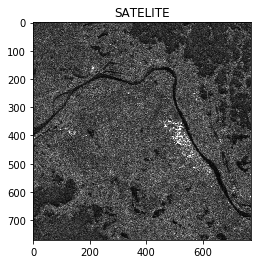

FILTRO MEDIA 3X3



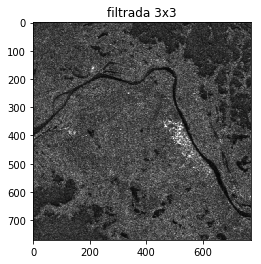

ELN imagen filtro media 3x3: 0.11294771754623462


In [62]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
import statistics as stats
print('FILTROS DE MEDIA SATELITE')
print()

Dmediaoriginal= cv2. imread ('sat.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Dmediaoriginal)
plt.title('SATELITE')
plt.show()
Dmedia=convertirespaciodecolor(Dmediaoriginal)
imDmedia=Dmedia[:,:,0]
nuevaDmedia,tama,tamanu=agregarceros(imDmedia)

print('FILTRO MEDIA 3X3')
print()
Dfiltradamedia3=filtromedia3x3(nuevaDmedia,tama,tamanu,Dmedia)
plt.imshow(Dfiltradamedia3)
plt.title('filtrada 3x3')
plt.show()

ELN=ELN(Dfiltradamedia3)
print('ELN imagen filtro media 3x3: '+ str(ELN))

## filtro de mediana ponderada 3x3

FILTROS DE MEDIA SATELITE



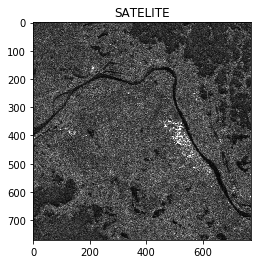

FILTRO MEDIANA PONDERADA 3X3



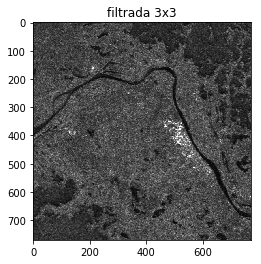

In [65]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
import statistics as stats

print('FILTROS DE MEDIA SATELITE')
mascara3x3=np.array ([[1,2,1],[2,4,2],[1,2,1]])
print()

Dmediaoriginal= cv2. imread ('sat.tif')
#A= cv2. imread ('parcial1.jpeg')
#A=cv2.cvtColor(A,cv2.COLOR_RGB2BGR)
plt.imshow(Dmediaoriginal)
plt.title('SATELITE')
plt.show()
Dmedia=convertirespaciodecolor(Dmediaoriginal)
imDmedia=Dmedia[:,:,0]
nuevaDmedia,tama,tamanu=agregarceros(imDmedia)

print('FILTRO MEDIANA PONDERADA 3X3')
print()
Dfiltradamedia3=filtromedianaponderada3x3(nuevaDmedia,tama,tamanu,Dmedia,mascara3x3)
plt.imshow(Dfiltradamedia3)
plt.title('filtrada 3x3')
plt.show()


In [71]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as myimg
import numpy as np
import statistics as stats
m=np.mean(Dfiltradamedia3)
v=np.var(Dfiltradamedia3)
ELN=m/v
print('ELN imagen filtro mediana ponderada 3x3: '+  str(ELN))

ELN imagen filtro mediana ponderada 3x3: 0.0944840572060659
